In [1]:
import os
import sys
import warnings
import pandas as pd
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.core.display import HTML
from plotnine import *
from stargazer.stargazer import Stargazer
from scipy import stats
from scipy.stats import norm
from datetime import datetime
import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

%matplotlib inline

warnings.filterwarnings('ignore')


In [2]:
!pip install stargazer

In [3]:
from py_helper_functions import *

In [4]:
df = pd.read_csv("health_ineq_online_table_2.csv")
df

,gnd,pctile,year,count,hh_inc,le_agg,le_raceadj,sd_le_agg,sd_le_raceadj
0,F,1,2001,398740,4.991094e+02,79.68207,79.89346,0.392838,0.385240
1,F,1,2002,411159,5.413069e+02,79.18359,79.41062,0.353981,0.346817
2,F,1,2003,420298,5.291391e+02,79.36441,79.57217,0.364781,0.359097
3,F,1,2004,427728,4.992995e+02,79.89841,80.09248,0.352019,0.347992
4,F,1,2005,433665,4.741454e+02,80.28360,80.46593,0.334612,0.330986
...,...,...,...,...,...,...,...,...,...
2795,M,100,2010,444908,1.915397e+06,88.76955,88.86678,0.524046,0.504820
2796,M,100,2011,441576,1.595813e+06,88.60163,88.71263,0.572685,0.552049
2797,M,100,2012,442401,1.828705e+06,88.12717,88.25696,0.632195,0.610853
2798,M,100,2013,439032,1.809494e+06,88.82390,88.93484,0.576337,0.556298


In [5]:
categorical_variables = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_variables

['gnd']

In [6]:
numeric_variables = df.select_dtypes(include=['int', 'float']).columns.tolist()
numeric_variables

['pctile',
 'year',
 'count',
 'hh_inc',
 'le_agg',
 'le_raceadj',
 'sd_le_agg',
 'sd_le_raceadj']

In [7]:
#Summary Statistics
df.describe()

,pctile,year,count,hh_inc,le_agg,le_raceadj,sd_le_agg,sd_le_raceadj
count,2800.000000,2800.000000,2800.000000,2.800000e+03,2800.000000,2800.000000,2800.000000,2800.000000
mean,50.500000,2007.500000,433773.845714,9.764774e+04,83.627406,83.672665,0.560205,0.550729
std,28.871226,4.031849,18872.974468,1.977964e+05,3.657129,3.600353,0.107541,0.106312
min,1.000000,2001.000000,387717.000000,1.375935e+02,67.862120,68.343380,0.179007,0.185262
25%,25.750000,2004.000000,421633.000000,3.083662e+04,81.774230,81.858478,0.494333,0.485487
50%,50.500000,2007.500000,436506.000000,6.119835e+04,84.143945,84.189405,0.560017,0.550386
75%,75.250000,2011.000000,445446.500000,1.048515e+05,86.313637,86.306168,0.624831,0.614215
max,100.000000,2014.000000,462127.000000,2.435930e+06,91.120700,91.076480,0.998827,0.974649


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gnd            2800 non-null   object 
 1   pctile         2800 non-null   int64  
 2   year           2800 non-null   int64  
 3   count          2800 non-null   int64  
 4   hh_inc         2800 non-null   float64
 5   le_agg         2800 non-null   float64
 6   le_raceadj     2800 non-null   float64
 7   sd_le_agg      2800 non-null   float64
 8   sd_le_raceadj  2800 non-null   float64
dtypes: float64(5), int64(3), object(1)
memory usage: 197.0+ KB


In [9]:
df.isna().sum()

gnd              0
pctile           0
year             0
count            0
hh_inc           0
le_agg           0
le_raceadj       0
sd_le_agg        0
sd_le_raceadj    0
dtype: int64

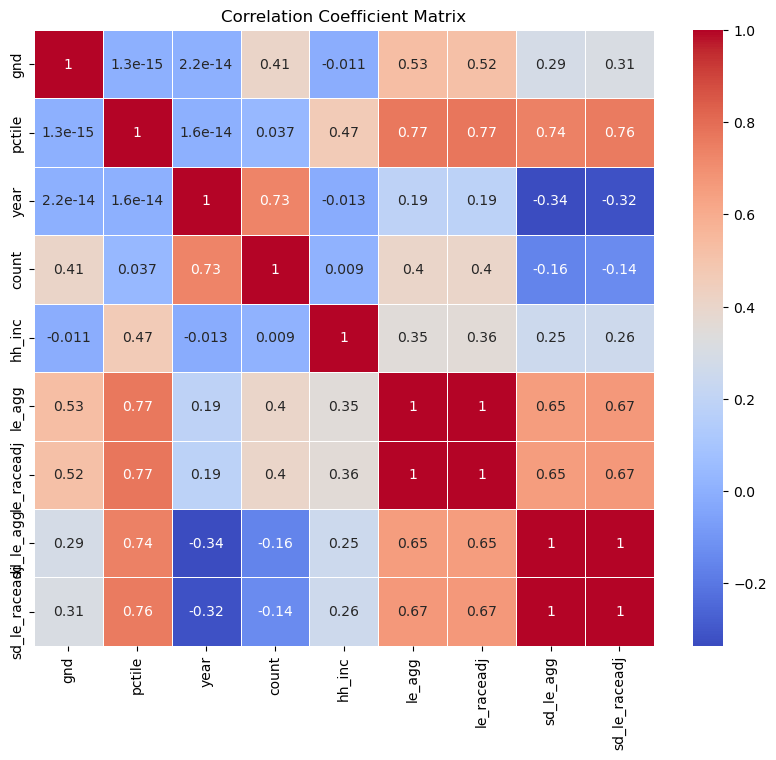

In [10]:
# Correlation in numerical data for df_num_dropped data
# Assuming df_num is your DataFrame
df['gnd'] = df['gnd'].replace({'F': 1, 'M': 0})
correlation_matrix = df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Set plot title
plt.yticks(rotation=90)
plt.title('Correlation Coefficient Matrix')

# Display the plot
plt.show()

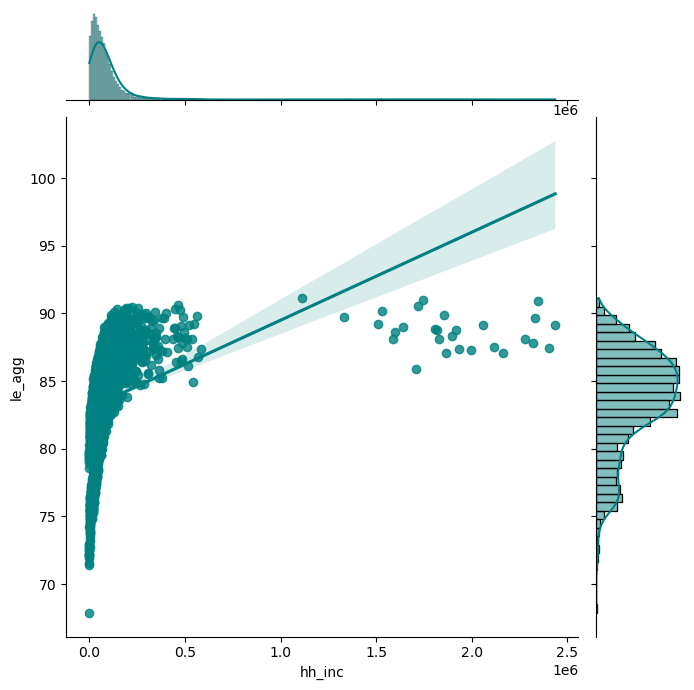

In [11]:
sns.jointplot(x="hh_inc", y="le_agg", data=df, kind='reg', color='teal', height=7)

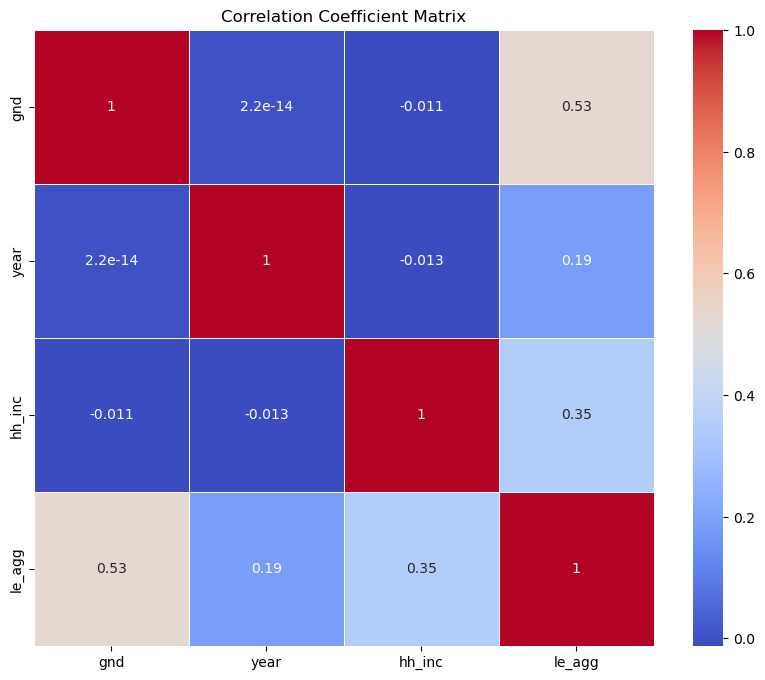

In [12]:
df_num = df[['gnd', 'year', 'hh_inc', 'le_agg']]

# Correlation in numerical data for df_num_dropped data
# Assuming df_num is your DataFrame
correlation_matrix = df_num.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Set plot title
plt.yticks(rotation=90)
plt.title('Correlation Coefficient Matrix')

# Display the plot
plt.show()

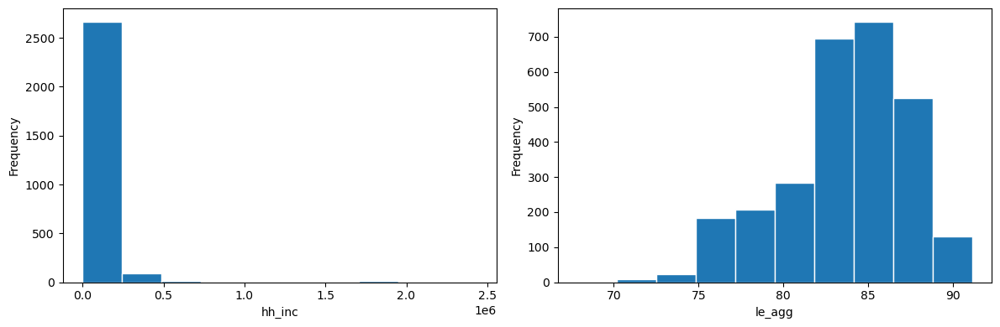

In [13]:
numerical_vars = ['hh_inc', 'le_agg']

# Create subplots for histograms
fig, axs = plt.subplots(1, len(numerical_vars), figsize=(12, 4))

# Plot histograms for each numerical variable
for i, var in enumerate(numerical_vars):
    axs[i].hist(df_num[var], edgecolor='white', align='mid')
    axs[i].set_xlabel(var)
    axs[i].set_ylabel('Frequency')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

In [14]:
from scipy import stats

# Define a list of numeric variables
adjusted_var = 'hh_inc'

# Compute upper and lower bounds for outliers
q_low = df[adjusted_var].quantile(0.05)
q_high = df[adjusted_var].quantile(0.95)

# Filter based on upper and lower bounds
df_filtered = df[(df[adjusted_var] >= q_low) & (df[adjusted_var] <= q_high)].copy()

# Calculate z-score
z_scores = stats.zscore(df_filtered[adjusted_var])

# Further filtering based on z-score
df_filtered = df_filtered[abs(z_scores) < 3]

In [15]:
df_filtered

,gnd,pctile,year,count,hh_inc,le_agg,le_raceadj,sd_le_agg,sd_le_raceadj
56,1,5,2001,399911,7560.236,81.29407,81.39002,0.504556,0.492849
57,1,5,2002,412534,7867.744,82.26780,82.34210,0.433818,0.425242
58,1,5,2003,421835,7753.258,81.66467,81.74560,0.461462,0.451978
59,1,5,2004,429350,7552.682,81.70566,81.78139,0.442139,0.434488
70,1,6,2001,399878,9163.891,81.88322,81.95913,0.495687,0.483780
...,...,...,...,...,...,...,...,...,...
2711,0,94,2010,444826,211740.800,87.62891,87.72523,0.585171,0.572968
2712,0,94,2011,441489,205220.500,87.81323,87.90520,0.580523,0.567354
2713,0,94,2012,442258,208084.000,87.61129,87.69585,0.520693,0.510577
2714,0,94,2013,438911,210773.300,87.26161,87.37386,0.625164,0.610447


In [16]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Extract hh_inc column as a separate DataFrame
hh_inc_values = df_filtered['hh_inc'].values.reshape(-1, 1)

# Scale the hh_inc column
scaled_hh_inc = scaler.fit_transform(hh_inc_values)

# Join scaled columns to df_filtered data frame
df_filtered['hh_inc_scaled'] = scaled_hh_inc

In [17]:
df_filtered

,gnd,pctile,year,count,hh_inc,le_agg,le_raceadj,sd_le_agg,sd_le_raceadj,hh_inc_scaled
56,1,5,2001,399911,7560.236,81.29407,81.39002,0.504556,0.492849,0.000036
57,1,5,2002,412534,7867.744,82.26780,82.34210,0.433818,0.425242,0.001505
58,1,5,2003,421835,7753.258,81.66467,81.74560,0.461462,0.451978,0.000958
59,1,5,2004,429350,7552.682,81.70566,81.78139,0.442139,0.434488,0.000000
70,1,6,2001,399878,9163.891,81.88322,81.95913,0.495687,0.483780,0.007696
...,...,...,...,...,...,...,...,...,...,...
2711,0,94,2010,444826,211740.800,87.62891,87.72523,0.585171,0.572968,0.975364
2712,0,94,2011,441489,205220.500,87.81323,87.90520,0.580523,0.567354,0.944218
2713,0,94,2012,442258,208084.000,87.61129,87.69585,0.520693,0.510577,0.957896
2714,0,94,2013,438911,210773.300,87.26161,87.37386,0.625164,0.610447,0.970743


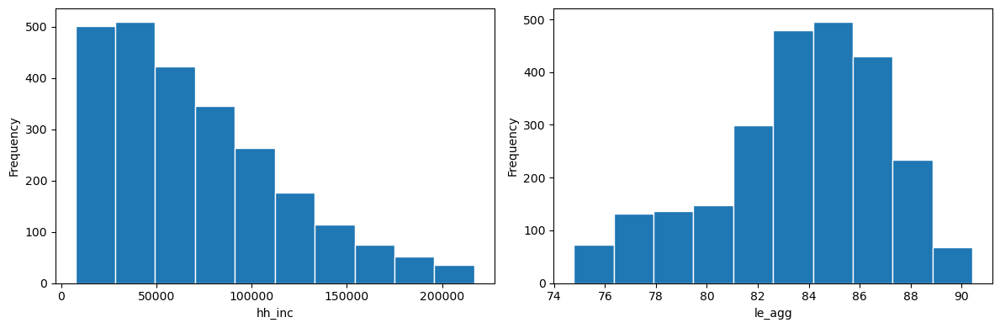

In [18]:
numerical_vars = ['hh_inc', 'le_agg']

# Create subplots for histograms
fig, axs = plt.subplots(1, len(numerical_vars), figsize=(12, 4))

# Plot histograms for each numerical variable
for i, var in enumerate(numerical_vars):
    axs[i].hist(df_filtered[var], edgecolor='white', align='mid')
    axs[i].set_xlabel(var)
    axs[i].set_ylabel('Frequency')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

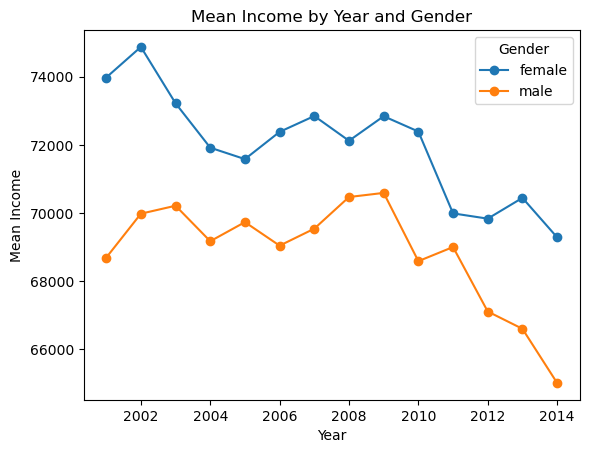

In [19]:
import matplotlib.pyplot as plt

# Average income grouped by year and gender
mean_income_by_year_gender = df_filtered.groupby(['year', 'gnd'])['hh_inc'].mean().unstack()

# Draw a time series line chart
mean_income_by_year_gender.plot(kind='line', marker='o')
plt.xlabel('Year')
plt.ylabel('Mean Income')
plt.title('Mean Income by Year and Gender')
plt.legend(labels=['female', 'male'], title='Gender')
plt.show()

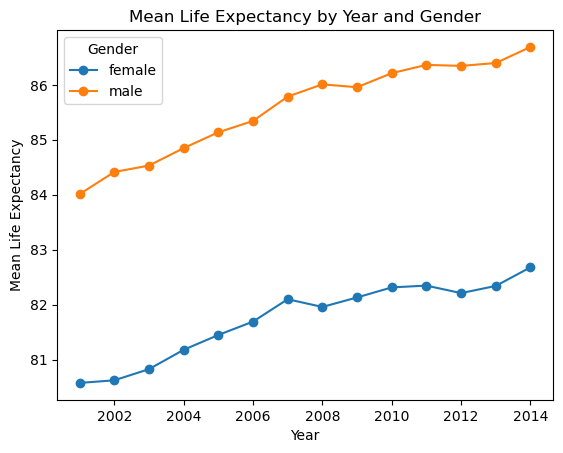

In [20]:
import matplotlib.pyplot as plt

# Average income grouped by year and gender
mean_income_by_year_gender = df_filtered.groupby(['year', 'gnd'])['le_agg'].mean().unstack()

# Draw a time series line chart
mean_income_by_year_gender.plot(kind='line', marker='o')
plt.xlabel('Year')
plt.ylabel('Mean Life Expectancy')
plt.title('Mean Life Expectancy by Year and Gender')
plt.legend(labels=['female', 'male'], title='Gender')
plt.show()

In [21]:
import numpy as np
import pandas as pd

# Convert the 'year' column to numeric
df_filtered['year'] = pd.to_numeric(df_filtered['year'], errors='coerce')

# Renumber the years from 2001 to 2014 to start with 1
df_filtered['year'] = df_filtered['year'] - 2000


df_filtered = df_filtered.drop(['count','sd_le_agg','sd_le_raceadj'], axis=1)

scaler = MinMaxScaler()  # or StandardScaler()
df_filtered['le_agg_scaled'] = scaler.fit_transform(df_filtered[['le_agg']])
df_filtered['le_raceadj_scaled'] = scaler.fit_transform(df_filtered[['le_raceadj']])

In [22]:
df_filtered

,gnd,pctile,year,hh_inc,le_agg,le_raceadj,hh_inc_scaled,le_agg_scaled,le_raceadj_scaled
56,1,5,1,7560.236,81.29407,81.39002,0.000036,0.416504,0.422101
57,1,5,2,7867.744,82.26780,82.34210,0.001505,0.478683,0.483897
58,1,5,3,7753.258,81.66467,81.74560,0.000958,0.440169,0.445180
59,1,5,4,7552.682,81.70566,81.78139,0.000000,0.442787,0.447503
70,1,6,1,9163.891,81.88322,81.95913,0.007696,0.454125,0.459040
...,...,...,...,...,...,...,...,...,...
2711,0,94,10,211740.800,87.62891,87.72523,0.975364,0.821024,0.833296
2712,0,94,11,205220.500,87.81323,87.90520,0.944218,0.832794,0.844978
2713,0,94,12,208084.000,87.61129,87.69585,0.957896,0.819899,0.831389
2714,0,94,13,210773.300,87.26161,87.37386,0.970743,0.797570,0.810490


# Descriptive table

In [23]:
(
    df_filtered[["gnd", "hh_inc", "le_agg"]]
    .describe()
    .rename(
        columns={
            "gnd": "Gender",
            "hh_inc": "Mean household income",
            "le_agg": "Unadjusted life expectancy"
        }
    )
    .T.rename(
        columns={
            "50%": "Median",
            "mean": "Mean",
            "count": "Observations",
            "max": "Maximum",
            "min": "Minimum",
            "std": "Std.Dev.",
        }
    )
    .round()
    .astype(int)
    .filter(["Mean", "Median", "Std.Dev.", "Minimum", "Maximum", "Observations"])
)

,Mean,Median,Std.Dev.,Minimum,Maximum,Observations
Gender,1,1,1,0,1,2495
Mean household income,70403,60772,46274,7553,216898,2495
Unadjusted life expectancy,84,84,3,75,90,2495


In [24]:
df_filtered

,gnd,pctile,year,hh_inc,le_agg,le_raceadj,hh_inc_scaled,le_agg_scaled,le_raceadj_scaled
56,1,5,1,7560.236,81.29407,81.39002,0.000036,0.416504,0.422101
57,1,5,2,7867.744,82.26780,82.34210,0.001505,0.478683,0.483897
58,1,5,3,7753.258,81.66467,81.74560,0.000958,0.440169,0.445180
59,1,5,4,7552.682,81.70566,81.78139,0.000000,0.442787,0.447503
70,1,6,1,9163.891,81.88322,81.95913,0.007696,0.454125,0.459040
...,...,...,...,...,...,...,...,...,...
2711,0,94,10,211740.800,87.62891,87.72523,0.975364,0.821024,0.833296
2712,0,94,11,205220.500,87.81323,87.90520,0.944218,0.832794,0.844978
2713,0,94,12,208084.000,87.61129,87.69585,0.957896,0.819899,0.831389
2714,0,94,13,210773.300,87.26161,87.37386,0.970743,0.797570,0.810490


# OLS and plots

In [25]:
# Household income vs unadjusted life expectancy and gender
reg = smf.ols("le_agg ~ hh_inc + gnd", data=df_filtered).fit()
print(reg.summary())

                            OLS Regression Results                            
Dep. Variable:                 le_agg   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     4776.
Date:                Sun, 02 Jul 2023   Prob (F-statistic):               0.00
Time:                        04:51:00   Log-Likelihood:                -4554.6
No. Observations:                2495   AIC:                             9115.
Df Residuals:                    2492   BIC:                             9133.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     78.2688      0.063   1235.447      0.0

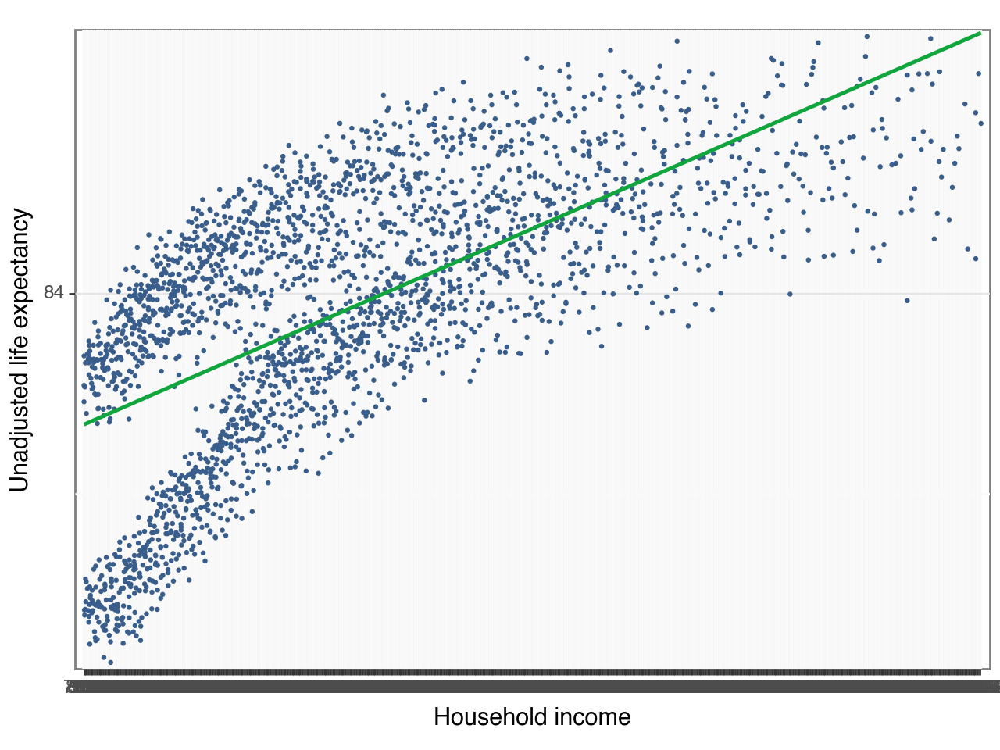

<Figure Size: (640 x 480)>

In [26]:
# Scatterplot and regression line comparing household income and raw life expectancy

# First, get the min and max of data
min_hh_inc, max_hh_inc = df_filtered['hh_inc'].min(), df_filtered['hh_inc'].max()
min_le_agg, max_le_agg = df_filtered['le_agg'].min(), df_filtered['le_agg'].max()

# Then, use these values to set the limits and breaks in your plot
(
    ggplot(df_filtered, aes(x="hh_inc", y="le_agg"))
    + geom_point(size=0.3, alpha=0.5, color=color[0])
    + geom_smooth(method="lm", color=color[1], se=False)
    + theme_bw()
    + labs(
        x="Household income",
        y="Unadjusted life expectancy",
    )
    + scale_y_continuous(expand=(0.01, 0.01), breaks=range(int(min_le_agg), int(max_le_agg)+1, 10))
    + scale_x_continuous(expand=(0.01, 0.01), breaks=range(int(min_hh_inc), int(max_hh_inc)+1, 500))
    + coord_cartesian(ylim=(min_le_agg, max_le_agg), xlim=(min_hh_inc, max_hh_inc), expand=True)
)


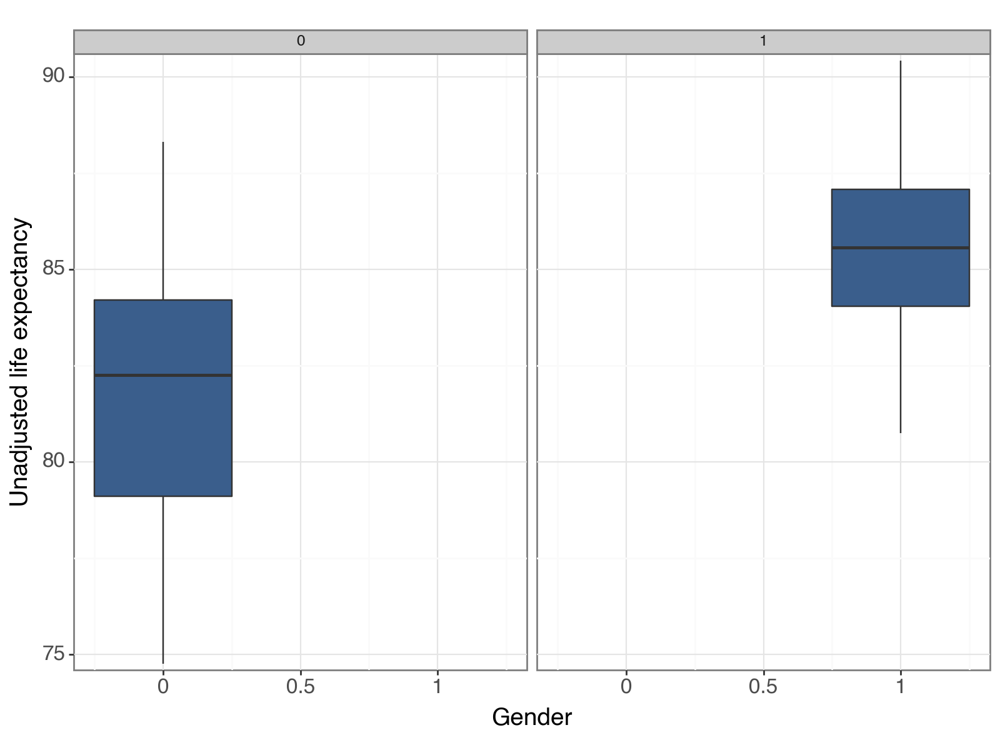

<Figure Size: (800 x 600)>

In [27]:
# Boxplots comparing gender and raw life expectancy, 0 being male and 1 being female

# Side-by-side boxplots
(
    ggplot(df_filtered, aes(x="gnd", y="le_agg"))
    + geom_boxplot(width=0.5, fill=color[0], outlier_shape = ".")
    + theme_bw()
    + labs(
        x="Gender",
        y="Unadjusted life expectancy",
    )
    + theme(
        axis_text_x=element_text(size=12),
        axis_text_y=element_text(size=12),
        axis_title=element_text(size=14, face="bold"),
        plot_title=element_text(size=16, face="bold"),
        figure_size=(8, 6)
    )
    + scale_y_continuous(expand=(0.01, 0.01))  # adjust the scale according to your data
    + coord_cartesian(expand=True)  # adjust the limits according to your data
    + facet_wrap("~gnd")  # creates separate plots for each gender
)


In [28]:
# Record estimated coefficients, standard errors, t-statistics, p-values, and other information for each model
reg1 = smf.ols("le_agg ~ gnd", data=df_filtered).fit(cov_type="HC1")
reg2 = smf.ols("le_agg ~ hh_inc", data=df_filtered).fit(cov_type="HC1")

In [29]:
# Create a table that displays the estimated coefficients, standard errors, t-statistics, and p-values for each model, along with the model fit statistics (R-squared, number of observations, etc.).
stargazer = Stargazer([reg1, reg2])
stargazer.covariate_order(["Intercept", "gnd", "hh_inc"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2"], [1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [30]:
# Running multiple models in regression table
reg1 = smf.ols("le_agg ~ gnd", data=df_filtered).fit(cov_type="HC1")
reg2 = smf.ols("le_agg ~ hh_inc", data=df_filtered).fit(cov_type="HC1")
reg3 = smf.ols("le_agg ~ gnd + hh_inc", data=df_filtered).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3])
stargazer.covariate_order(["Intercept", "gnd", "hh_inc"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3"], [1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())


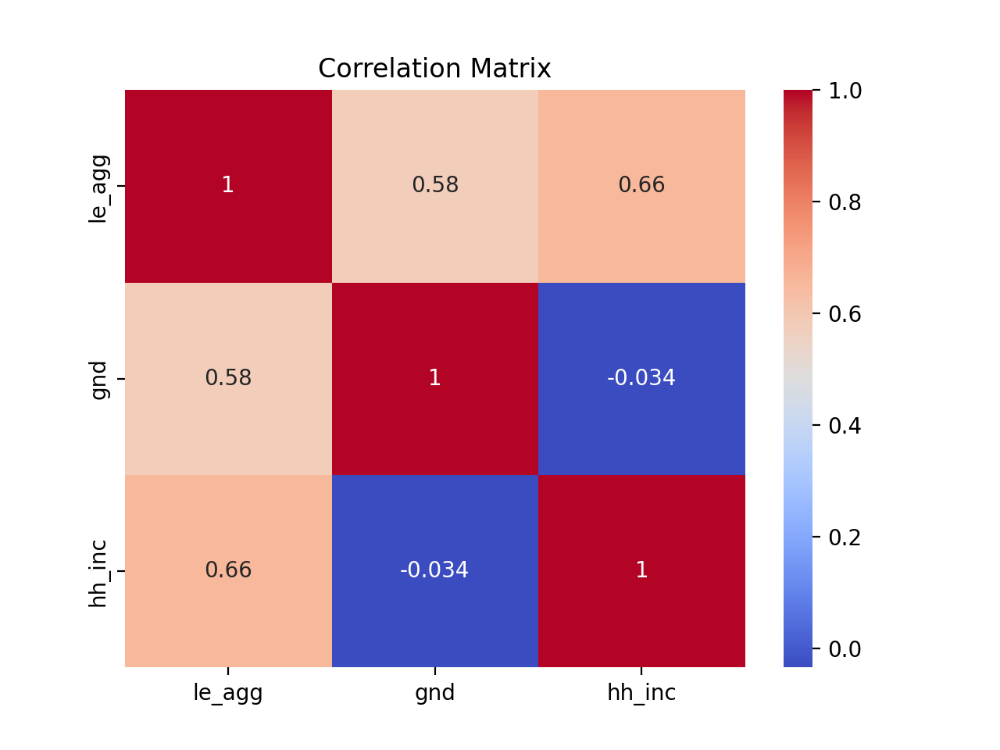

In [31]:
# Create a correlation heat map for this data
import seaborn as sns
import matplotlib.pyplot as plt

# Select the relevant variables for the correlation matrix
correlation_matrix = df_filtered[['le_agg', 'gnd', 'hh_inc']].corr()

# Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


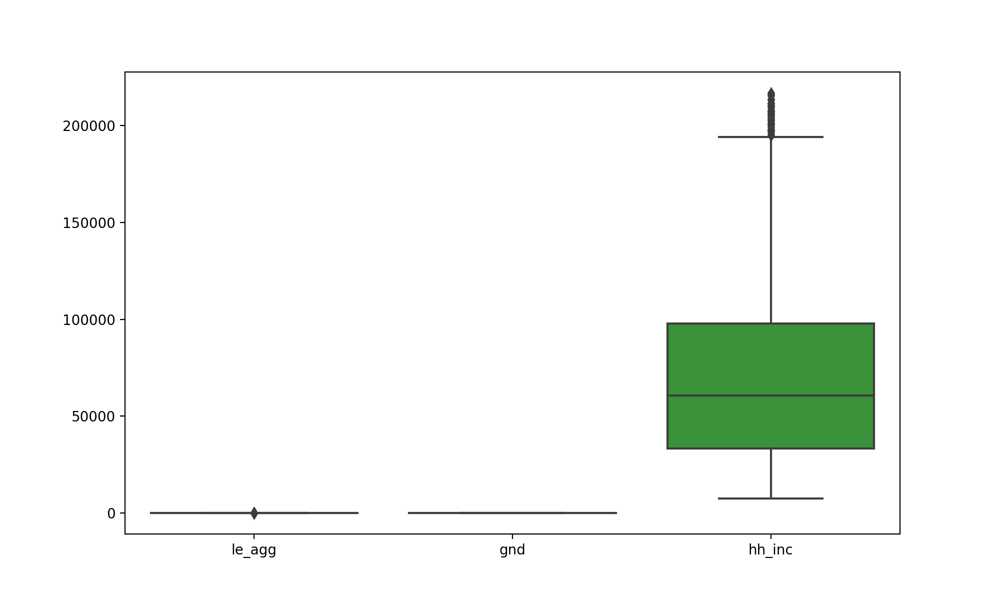

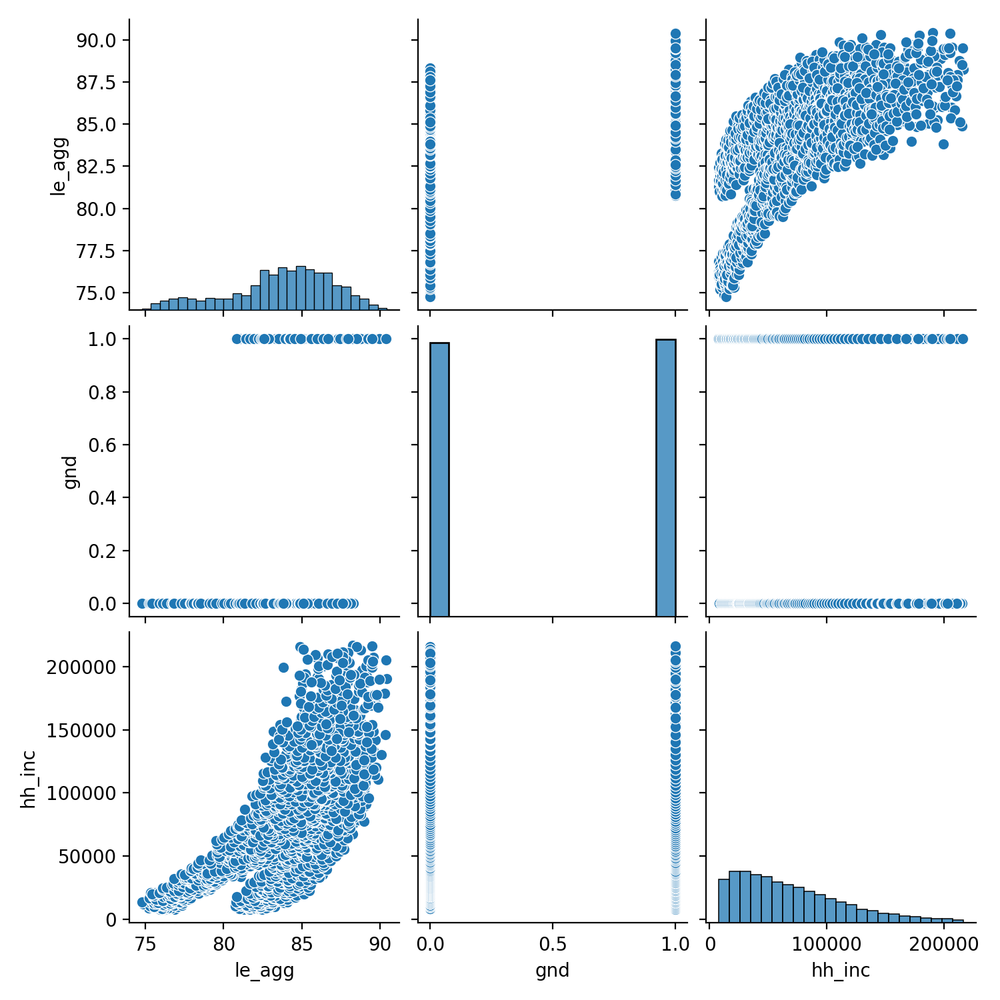

In [32]:
#Create visualizations to explore the distribution and relationships of the numerical variables
import seaborn as sns
import matplotlib.pyplot as plt

# Box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_filtered[['le_agg', 'gnd', 'hh_inc']])
plt.show()

# Scatter plot matrix
# Note: pairplot may not be meaningful if 'gnd' is a binary variable
sns.pairplot(df_filtered[['le_agg', 'gnd', 'hh_inc']])
plt.show()

In [33]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Select the variables to be scaled
variables_to_scale = ['le_agg', 'hh_inc']

# Perform the scaling
df_filtered_scaled = df_filtered.copy()
df_filtered_scaled[variables_to_scale] = scaler.fit_transform(df_filtered[variables_to_scale])


In [34]:
df_filtered_scaled

,gnd,pctile,year,hh_inc,le_agg,le_raceadj,hh_inc_scaled,le_agg_scaled,le_raceadj_scaled
56,1,5,1,-1.358316,-0.719295,81.39002,0.000036,0.416504,0.422101
57,1,5,2,-1.351669,-0.424336,82.34210,0.001505,0.478683,0.483897
58,1,5,3,-1.354144,-0.607034,81.74560,0.000958,0.440169,0.445180
59,1,5,4,-1.358479,-0.594618,81.78139,0.000000,0.442787,0.447503
70,1,6,1,-1.323653,-0.540832,81.95913,0.007696,0.454125,0.459040
...,...,...,...,...,...,...,...,...,...
2711,0,94,10,3.054974,1.199632,87.72523,0.975364,0.821024,0.833296
2712,0,94,11,2.914040,1.255465,87.90520,0.944218,0.832794,0.844978
2713,0,94,12,2.975934,1.194295,87.69585,0.957896,0.819899,0.831389
2714,0,94,13,3.034062,1.088371,87.37386,0.970743,0.797570,0.810490


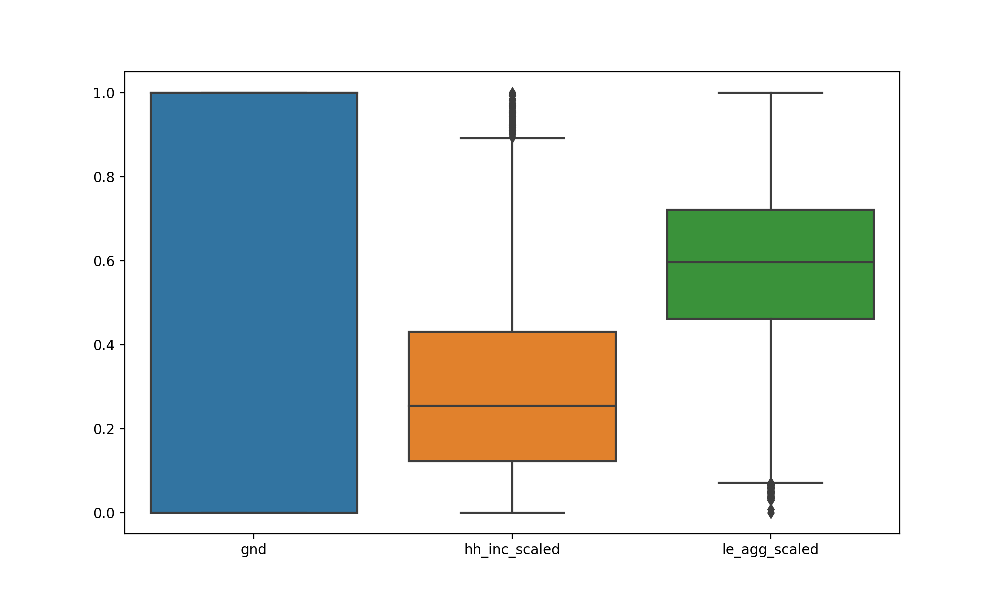

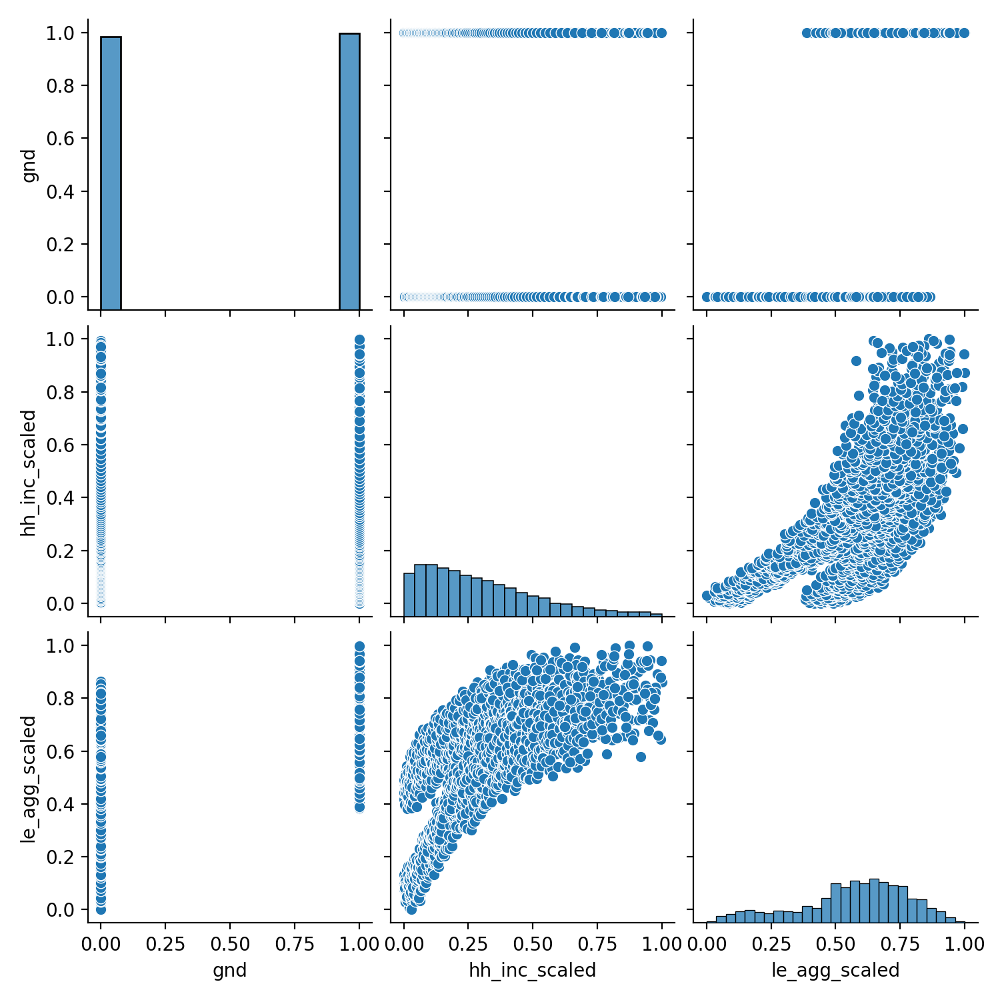

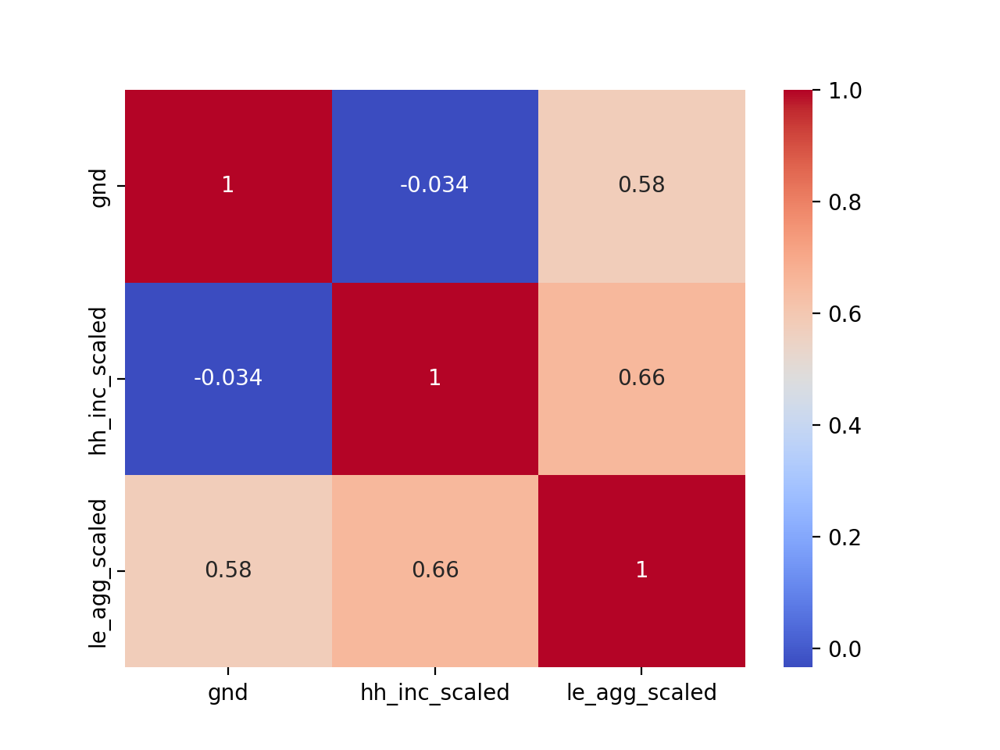

In [35]:
# Drop the confounding columns
df_filtered_scaled = df_filtered_scaled.drop(columns=["le_raceadj", "le_raceadj_scaled", "year", "pctile", "hh_inc", "le_agg"])

# Box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_filtered_scaled)
plt.show()

# Scatter plot matrix
sns.pairplot(df_filtered_scaled)
plt.show()

# Correlation matrix
correlation_matrix = df_filtered_scaled.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


In [36]:
df_filtered_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2495 entries, 56 to 2715
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gnd            2495 non-null   int64  
 1   hh_inc_scaled  2495 non-null   float64
 2   le_agg_scaled  2495 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 78.0 KB


In [37]:
df_filtered_scaled.describe()

,gnd,hh_inc_scaled,le_agg_scaled
count,2495.000000,2495.000000,2495.000000
mean,0.503006,0.300221,0.568135
std,0.500091,0.221042,0.210847
min,0.000000,0.000000,0.000000
25%,0.000000,0.123094,0.461587
50%,1.000000,0.254217,0.596582
75%,1.000000,0.430844,0.721569
max,1.000000,1.000000,1.000000


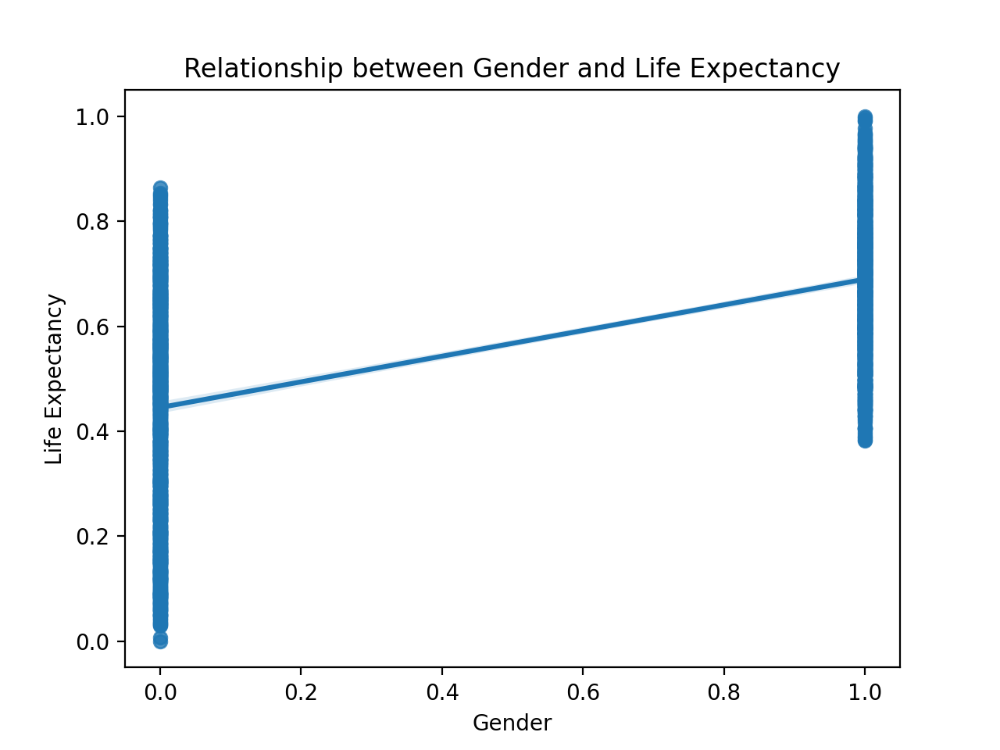

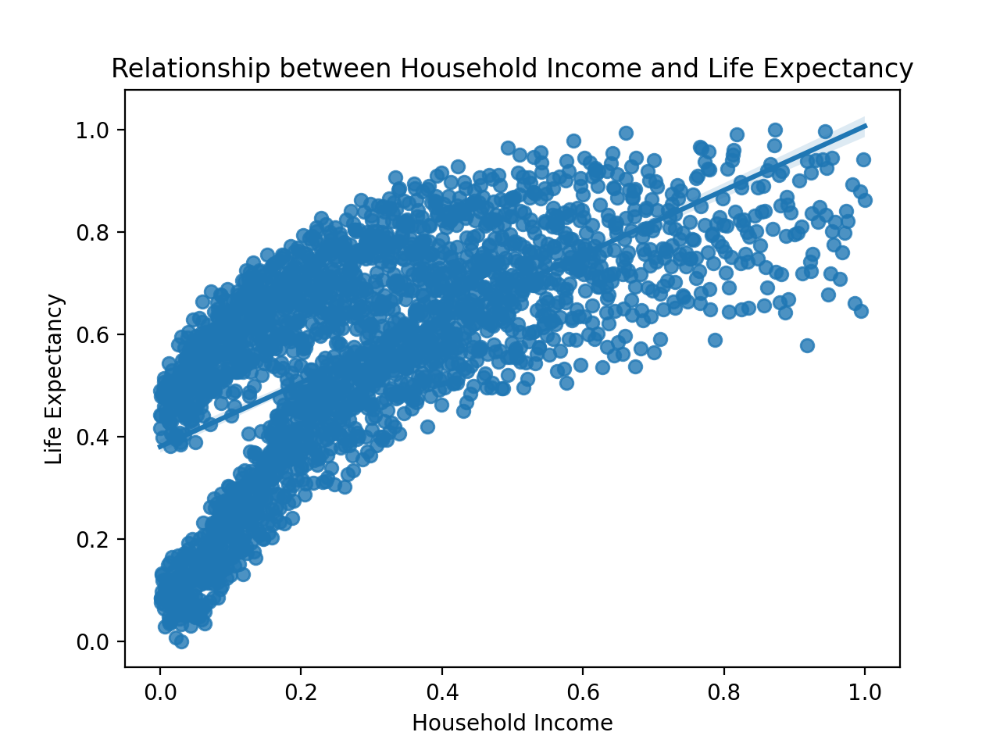

In [38]:
# Relationship with Gender
sns.regplot(x='gnd', y='le_agg_scaled', data=df_filtered_scaled)
plt.xlabel('Gender')
plt.ylabel('Life Expectancy')
plt.title('Relationship between Gender and Life Expectancy')
plt.show()

# Relationship with Household Income
sns.regplot(x='hh_inc_scaled', y='le_agg_scaled', data=df_filtered_scaled)
plt.xlabel('Household Income')
plt.ylabel('Life Expectancy')
plt.title('Relationship between Household Income and Life Expectancy')
plt.show()


In [39]:
reg1 = smf.ols("le_agg_scaled ~ gnd", data=df_filtered_scaled).fit(cov_type="HC1")
reg2 = smf.ols("le_agg_scaled ~ hh_inc_scaled", data=df_filtered_scaled).fit(cov_type="HC1")
reg3 = smf.ols("le_agg_scaled ~ gnd + hh_inc_scaled", data=df_filtered_scaled).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3])
stargazer.covariate_order(["Intercept", "gnd", "hh_inc_scaled"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3"], [1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())


In [40]:
# Calculate the z-score for each variable
z_scores_gnd = np.abs((df_filtered_scaled['gnd'] - df_filtered_scaled['gnd'].mean()) / df_filtered_scaled['gnd'].std())
z_scores_hh_inc_scaled = np.abs((df_filtered_scaled['hh_inc_scaled'] - df_filtered_scaled['hh_inc_scaled'].mean()) / df_filtered_scaled['hh_inc_scaled'].std())
z_scores_le_agg_scaled = np.abs((df_filtered_scaled['le_agg_scaled'] - df_filtered_scaled['le_agg_scaled'].mean()) / df_filtered_scaled['le_agg_scaled'].std())

# Define a threshold for outliers (e.g., z-score > 3)
threshold = 3

# Remove outliers from the dataset
df_filtered_scaled = df_filtered_scaled[(z_scores_gnd <= threshold) & (z_scores_hh_inc_scaled <= threshold) & (z_scores_le_agg_scaled <= threshold)]

# Check the updated statistics of the filtered dataset
df_filtered_scaled.describe()


,gnd,hh_inc_scaled,le_agg_scaled
count,2484.000000,2484.000000,2484.000000
mean,0.502818,0.297201,0.567107
std,0.500093,0.216808,0.210655
min,0.000000,0.000000,0.000000
25%,0.000000,0.122100,0.460109
50%,1.000000,0.252460,0.596164
75%,1.000000,0.429049,0.720369
max,1.000000,0.957896,1.000000


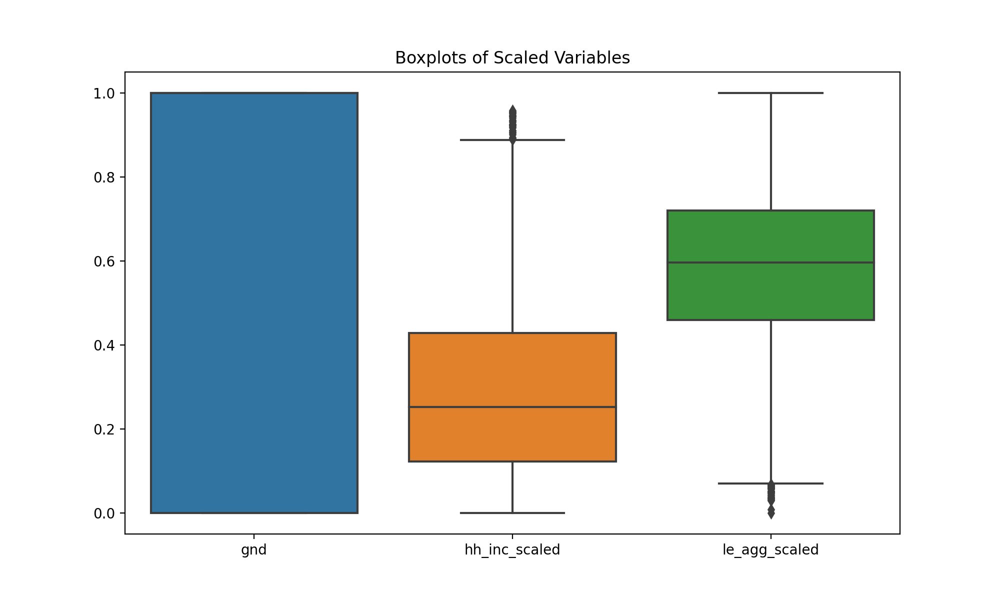

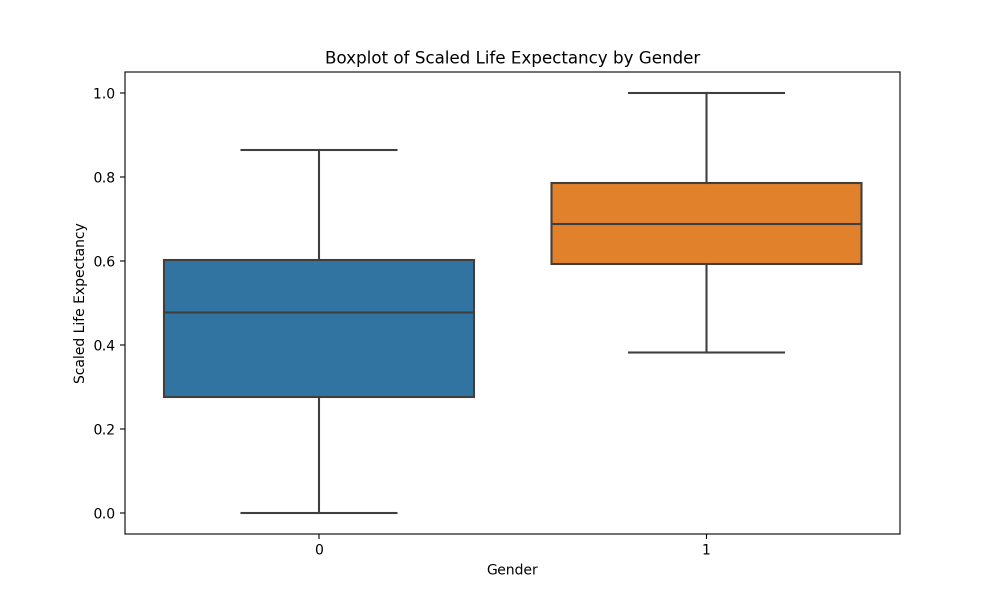

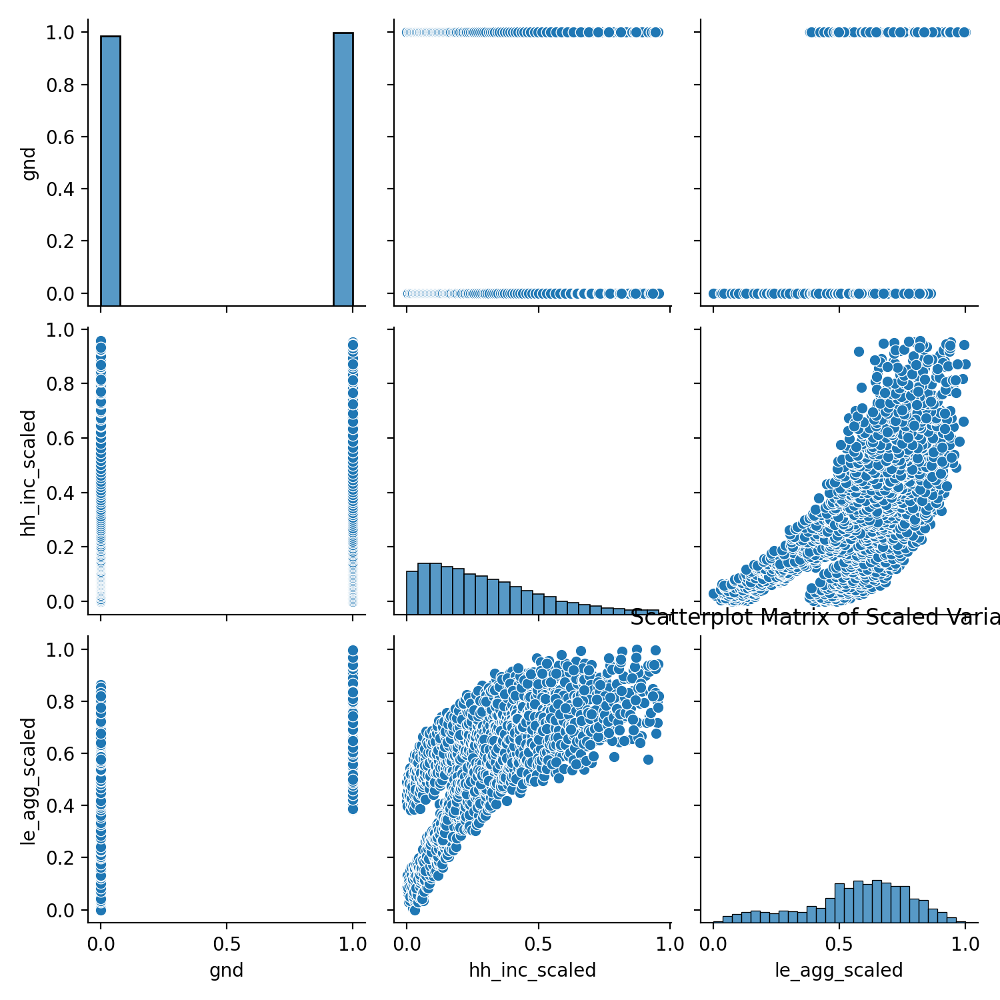

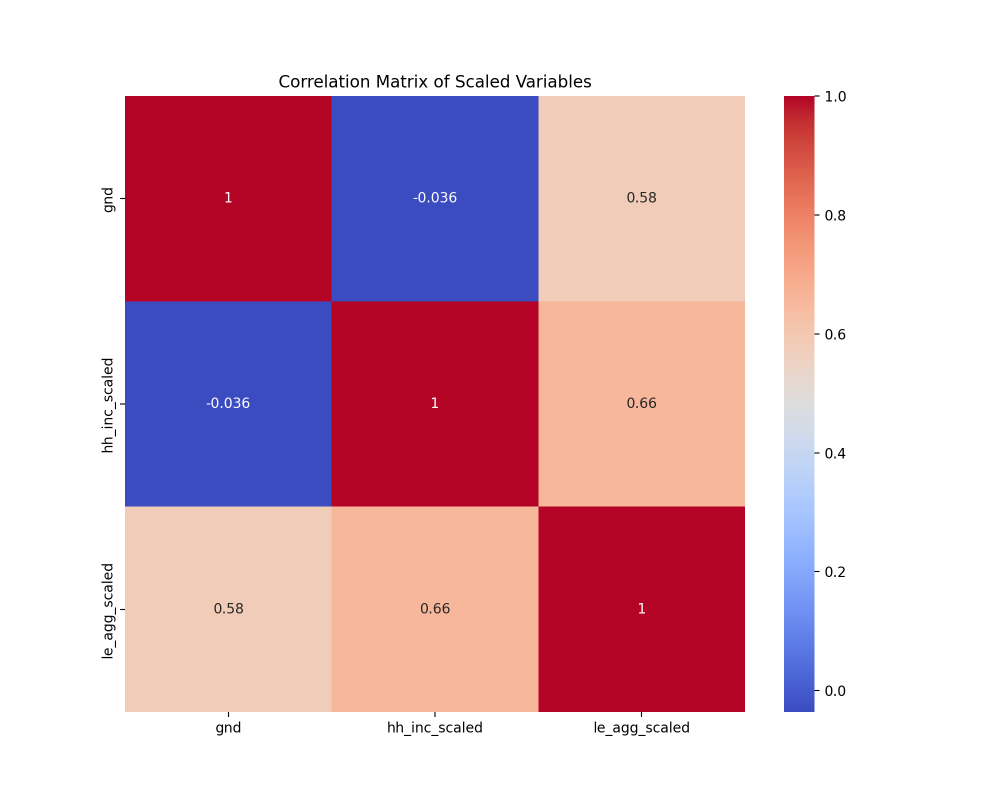

In [41]:
# Create visualizations to explore the distribution and relationships of the numerical variables. Some common plots include histograms, box plots, scatter plots, and correlation matrices.

# Box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_filtered_scaled)
plt.title('Boxplots of Scaled Variables')
plt.show()

# Side-by-side boxplots for 'gnd'
plt.figure(figsize=(10, 6))
sns.boxplot(x='gnd', y='le_agg_scaled', data=df_filtered_scaled)
plt.title('Boxplot of Scaled Life Expectancy by Gender')
plt.xlabel('Gender')
plt.ylabel('Scaled Life Expectancy')
plt.show()

# Scatter plot matrix
sns.pairplot(df_filtered_scaled)
plt.title('Scatterplot Matrix of Scaled Variables')
plt.show()

# Correlation matrix
correlation_matrix = df_filtered_scaled.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Scaled Variables')
plt.show()


In [42]:
df_filtered_scaled

,gnd,hh_inc_scaled,le_agg_scaled
56,1,0.000036,0.416504
57,1,0.001505,0.478683
58,1,0.000958,0.440169
59,1,0.000000,0.442787
70,1,0.007696,0.454125
...,...,...,...
2706,0,0.926051,0.757009
2707,0,0.955982,0.775632
2712,0,0.944218,0.832794
2713,0,0.957896,0.819899


In [43]:
# Check stepwise model at this stage

reg1 = smf.ols("le_agg_scaled ~ gnd", data=df_filtered_scaled).fit(cov_type="HC1")
reg2 = smf.ols("le_agg_scaled ~ hh_inc_scaled", data=df_filtered_scaled).fit(cov_type="HC1")
reg3 = smf.ols("le_agg_scaled ~ gnd + hh_inc_scaled", data=df_filtered_scaled).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3])
stargazer.covariate_order(["Intercept", "gnd", "hh_inc_scaled"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3"], [1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())


In [44]:
# Considering IVs Regression
numeric_variables = df_filtered_scaled.select_dtypes(include=['int', 'float']).columns.tolist()
numeric_variables


['gnd', 'hh_inc_scaled', 'le_agg_scaled']

In [45]:
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML

# Define the models
reg1 = smf.ols("le_agg_scaled ~ gnd", data=df_filtered_scaled).fit(cov_type="HC1")
reg2 = smf.ols("le_agg_scaled ~ hh_inc_scaled", data=df_filtered_scaled).fit(cov_type="HC1")

# Create a Stargazer object
stargazer = Stargazer([reg1, reg2])

# Specify the order of the covariates
stargazer.covariate_order(["Intercept", "gnd", "hh_inc_scaled"])

# Rename the covariates
stargazer.rename_covariates({"Intercept": "Constant"})

# Specify the custom columns
stargazer.custom_columns(["Model 1", "Model 2"], [1, 1])

# Hide model numbers
stargazer.show_model_numbers(False)

# Render the table in HTML
HTML(stargazer.render_html())


In [46]:
# With too many potential factors that could violate the exclusion restriction of an instrumental variable given the 
# relatively limited scope of this data set, we thought it wise to forego this step of the analysis.

Based on the results from the OLS models above, it seems that both 'gnd' and 'hh_inc_scaled' have significant effects on the outcome variable 'le_agg_scaled'. Here are some key observations based on the provided results:

Coefficient estimates: The coefficient estimates for both 'gnd' and 'hh_inc_scaled' are positive and statistically significant. This suggests that there is a positive relationship between these variables and 'le_agg_scaled', indicating that an increase in either 'gnd' or 'hh_inc_scaled' is associated with an increase in 'le_agg_scaled'.

Gender ('gnd'): In Model 1, the coefficient for 'gnd' is 0.245 and is statistically significant. This suggests that, holding all else constant, the expected value of 'le_agg_scaled' is 0.245 units higher for one gender compared to the other. However, without additional context, it's hard to interpret the practical significance of this effect.

Household income ('hh_inc_scaled'): In Model 2, the coefficient for 'hh_inc_scaled' is 0.639 and is statistically significant. This suggests that, holding all else constant, a one-unit increase in 'hh_inc_scaled' is associated with a 0.639 unit increase in 'le_agg_scaled'. This indicates a strong positive relationship between household income and life expectancy.

Model comparison: Comparing the R-squared values of the two models, we see that Model 2 (which includes 'hh_inc_scaled') explains more of the variation in 'le_agg_scaled' than Model 1 (which includes 'gnd'). This suggests that 'hh_inc_scaled' may be a more important predictor of 'le_agg_scaled' than 'gnd' in this dataset.

Overall, both 'gnd' and 'hh_inc_scaled' appear to have significant effects on 'le_agg_scaled'. However, 'hh_inc_scaled' seems to be a stronger predictor of 'le_agg_scaled' than 'gnd', as indicated by the higher R-squared value in Model 2. These results provide valuable insights into the relationships between gender, household income, and life expectancy.

# Using ML models to improve estimation results given OLS specifications

In [47]:
# Define a new df for prediction
selected_columns = ['gnd', 'pctile', 'year', 'count', 'hh_inc', 'le_agg', 'le_raceadj', 'sd_le_agg', 'sd_le_raceadj']

df_pred = df[selected_columns].copy()

# Convert categorical variables to numerical variables
categorical_columns = ['gnd', 'year']  # Add other categorical variables if any
for col in categorical_columns:
    df_pred[col] = df_pred[col].astype('category').cat.codes

# Convert the remaining columns to float
df_pred = df_pred.astype(float)


In [48]:
# EDA and Feature Engineering for numerical variables
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gnd            2800 non-null   float64
 1   pctile         2800 non-null   float64
 2   year           2800 non-null   float64
 3   count          2800 non-null   float64
 4   hh_inc         2800 non-null   float64
 5   le_agg         2800 non-null   float64
 6   le_raceadj     2800 non-null   float64
 7   sd_le_agg      2800 non-null   float64
 8   sd_le_raceadj  2800 non-null   float64
dtypes: float64(9)
memory usage: 197.0 KB


In [49]:
df_pred1 = df_pred.drop(['le_agg'], axis=1)
df_pred1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gnd            2800 non-null   float64
 1   pctile         2800 non-null   float64
 2   year           2800 non-null   float64
 3   count          2800 non-null   float64
 4   hh_inc         2800 non-null   float64
 5   le_raceadj     2800 non-null   float64
 6   sd_le_agg      2800 non-null   float64
 7   sd_le_raceadj  2800 non-null   float64
dtypes: float64(8)
memory usage: 175.1 KB


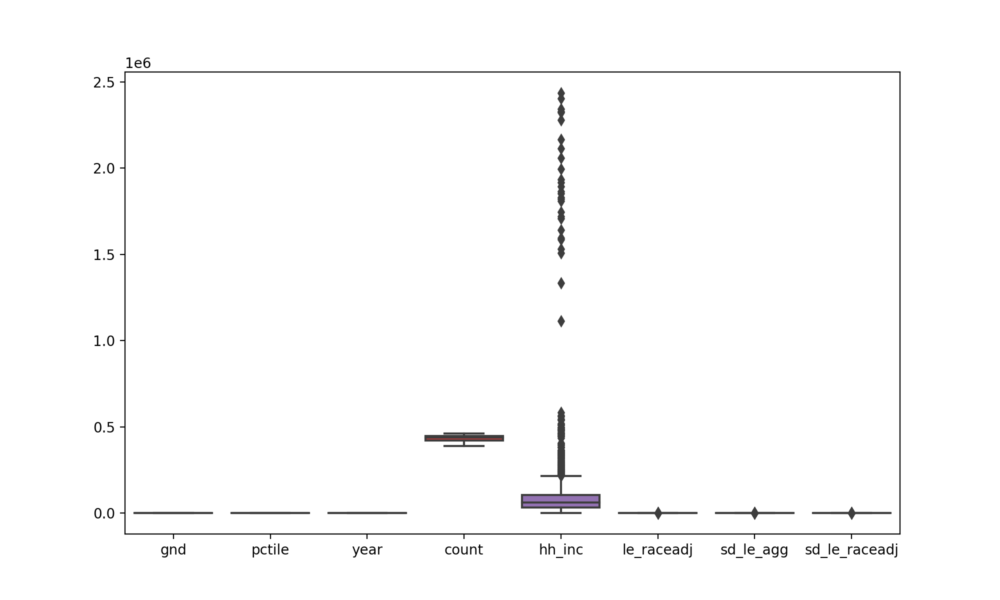

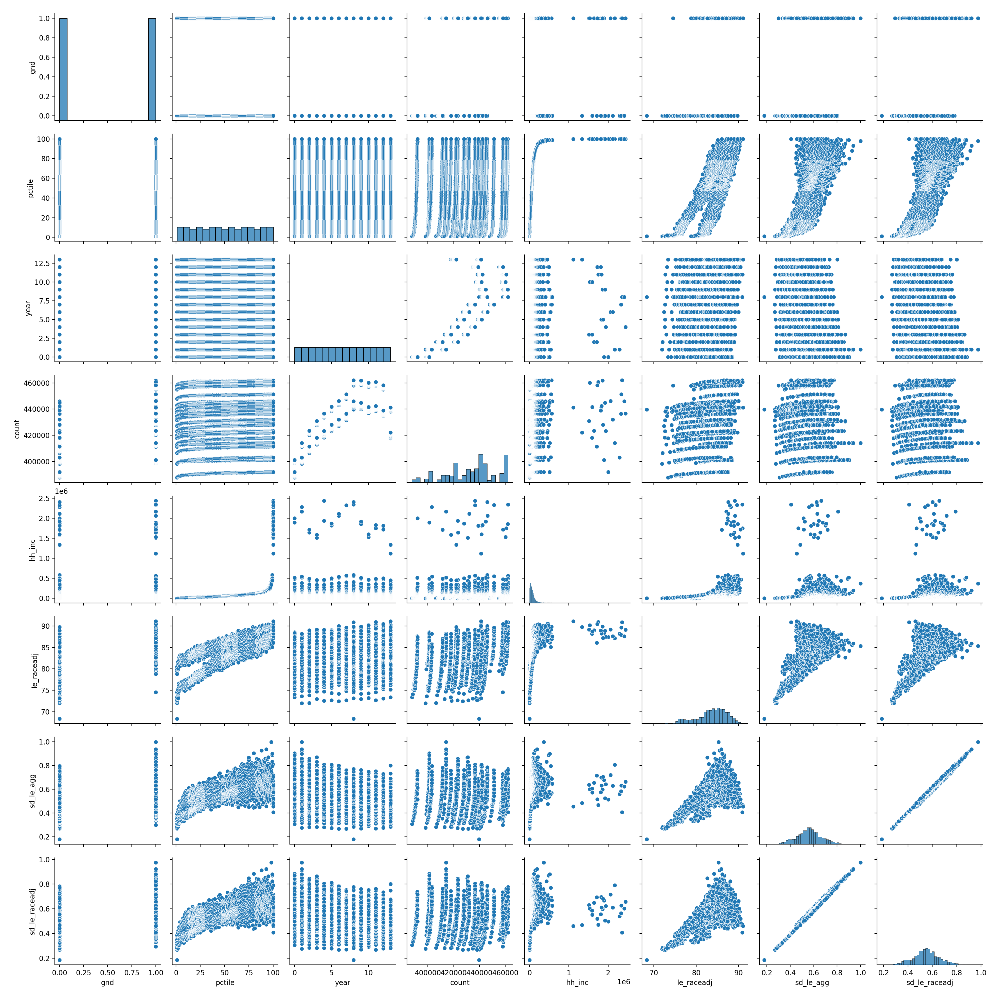

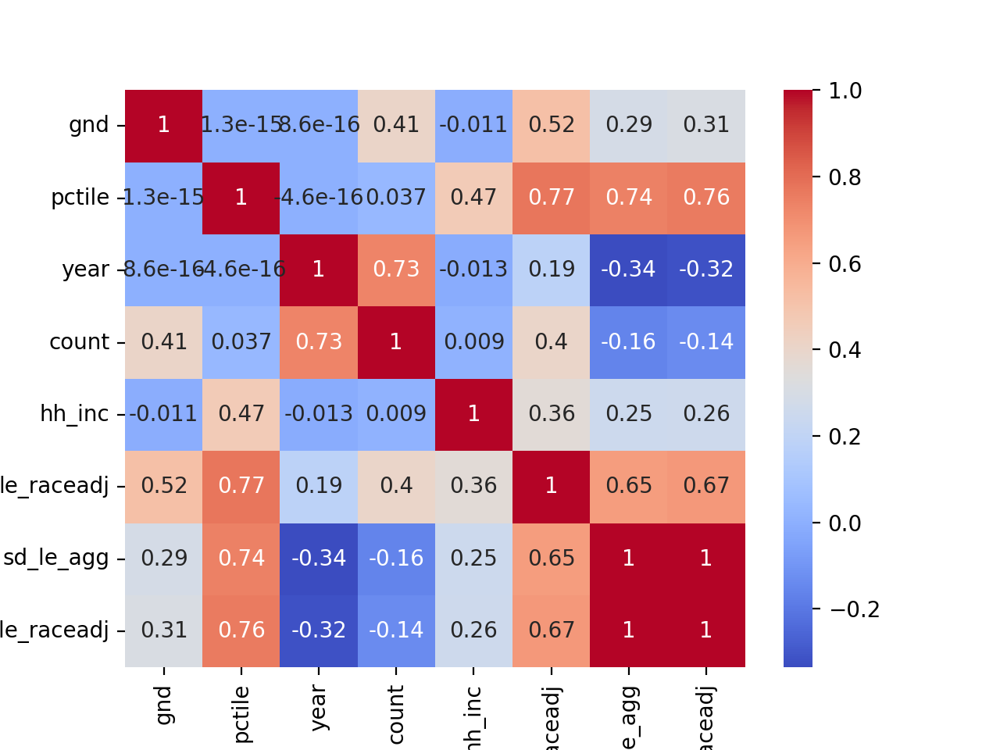

In [50]:
#Create visualizations to explore the distribution and relationships of the numerical variables. Some common plots include histograms, box plots, scatter plots, and correlation matrices.
# Box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_pred1)
plt.show()

# Scatter plot matrix
sns.pairplot(df_pred1)
plt.show()

# Correlation matrix
correlation_matrix = df_pred1.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [51]:
#Scaling 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_pred_scaled = pd.DataFrame(scaler.fit_transform(df_pred1), columns=df_pred1.columns)
df_pred_scaled

,gnd,pctile,year,count,hh_inc,le_raceadj,sd_le_agg,sd_le_raceadj
0,1.0,-1.714816,-1.612452,-1.856629,-0.491242,-1.049864,-1.556590,-1.556915
1,1.0,-1.714816,-1.364382,-1.198480,-0.491029,-1.183997,-1.917977,-1.918393
2,1.0,-1.714816,-1.116313,-0.714156,-0.491091,-1.139118,-1.817535,-1.802867
3,1.0,-1.714816,-0.868243,-0.320401,-0.491242,-0.994576,-1.936228,-1.907345
4,1.0,-1.714816,-0.620174,-0.005768,-0.491369,-0.890831,-2.098120,-2.067336
...,...,...,...,...,...,...,...,...
2795,-1.0,1.714816,0.620174,0.590058,9.191644,1.442926,-0.336296,-0.431913
2796,-1.0,1.714816,0.868243,0.413477,7.575633,1.400103,0.116066,0.012414
2797,-1.0,1.714816,1.116313,0.457198,8.753277,1.273518,0.669536,0.565647
2798,-1.0,1.714816,1.364382,0.278657,8.656134,1.461833,0.150034,0.052390


In [52]:
# EDA and Feature Engineering for numerical variables
df_pred_scaled.describe()

,gnd,pctile,year,count,hh_inc,le_raceadj,sd_le_agg,sd_le_raceadj
count,2800.000000,2800.000000,2.800000e+03,2.800000e+03,2.800000e+03,2.800000e+03,2.800000e+03,2.800000e+03
mean,0.000000,0.000000,2.537653e-18,-1.218073e-15,-1.015061e-17,-4.060244e-15,1.624098e-16,-6.090366e-17
std,1.000179,1.000179,1.000179e+00,1.000179e+00,1.000179e+00,1.000179e+00,1.000179e+00,1.000179e+00
min,-1.000000,-1.714816,-1.612452e+00,-2.440796e+00,-4.930705e-01,-4.258478e+00,-3.545307e+00,-3.438294e+00
25%,-1.000000,-0.857408,-8.682431e-01,-6.434076e-01,-3.378376e-01,-5.039816e-01,-6.126376e-01,-6.137922e-01
50%,0.000000,0.000000,0.000000e+00,1.447913e-01,-1.843103e-01,1.435504e-01,-1.752295e-03,-3.227945e-03
75%,1.000000,0.857408,8.682431e-01,6.185956e-01,3.642657e-02,7.315873e-01,6.010523e-01,5.972747e-01
max,1.000000,1.714816,1.612452e+00,1.502583e+00,1.182378e+01,2.056781e+00,4.079374e+00,3.988218e+00


Explained Variance Ratio for PC1: 0.9909786072669771
Explained Variance Ratio for PC2: 0.00902137578006944
Explained Variance Ratio for PC3: 1.6671898915786115e-08
Explained Variance Ratio for PC4: 2.0119811217711466e-10
Explained Variance Ratio for PC5: 7.819258855988761e-11
Explained Variance Ratio for PC6: 1.5404269517454107e-12
Explained Variance Ratio for PC7: 1.2323288706322177e-13
Explained Variance Ratio for PC8: 1.7682622629651232e-16


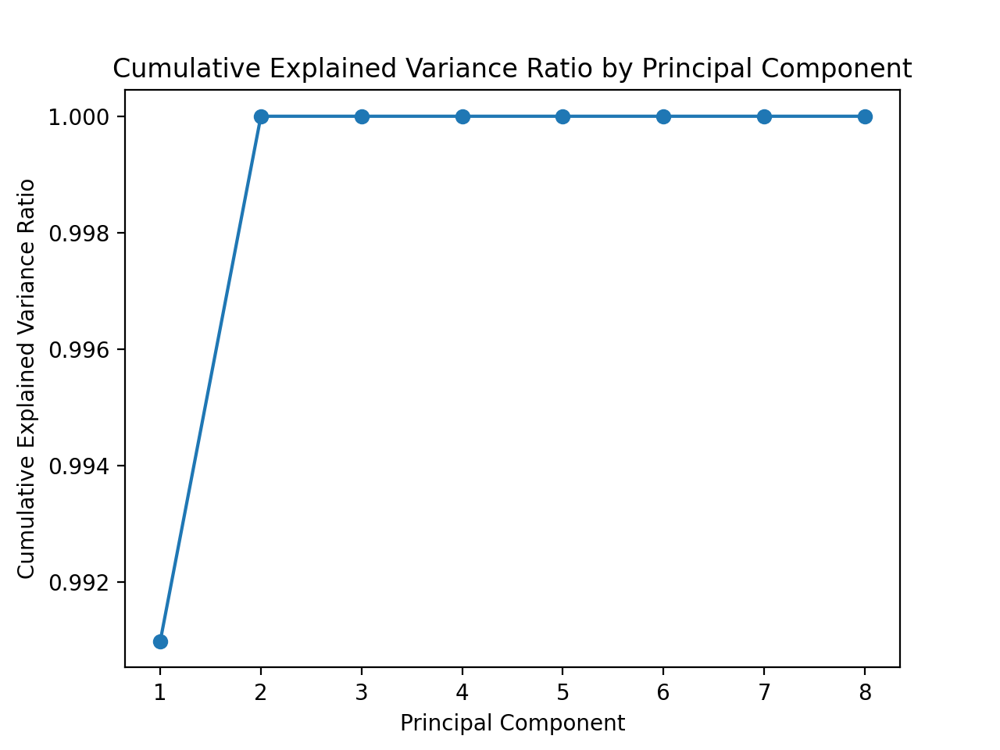

In [53]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Instantiate PCA with the number of components equal to the number of columns in the scaled numerical data
pca = PCA(n_components=8)

# Apply PCA to the scaled numerical data
pca.fit(df_pred1)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Get the cumulative explained variance ratio
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)

# Print the explained variance ratio for each principal component
for i, ratio in enumerate(explained_variance_ratio):
    print(f"Explained Variance Ratio for PC{i+1}: {ratio}")

# Plot the cumulative explained variance ratio
plt.plot(range(1, 9), cumulative_explained_variance_ratio, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Principal Component')
plt.show()


Variable Contributions for PCs:
          gnd    pctile      year     count    hh_inc  le_raceadj  sd_le_agg  \
PC0 -0.205854 -0.457824  0.082552 -0.030807 -0.238146   -0.454680  -0.485644   
PC1 -0.290804  0.000706 -0.590518 -0.656799 -0.010249   -0.282802   0.174585   
PC2 -0.658734  0.347555  0.291231 -0.037505  0.570124   -0.015881  -0.128818   
PC3  0.453727 -0.259116 -0.304895 -0.022360  0.755426   -0.013857  -0.177797   
PC4 -0.028794 -0.401043  0.356170  0.134896  0.214453   -0.542046   0.435741   
PC5  0.267827 -0.086617  0.577816 -0.739541  0.007626    0.193355  -0.035968   
PC6  0.397545  0.653565  0.076924 -0.025271 -0.036871   -0.615568  -0.167036   
PC7 -0.051537 -0.083525 -0.007215 -0.001900  0.007967    0.052164  -0.682935   

     sd_le_raceadj  
PC0      -0.490877  
PC1       0.157402  
PC2      -0.131014  
PC3      -0.176232  
PC4       0.404485  
PC5      -0.035156  
PC6      -0.008430  
PC7       0.721891  


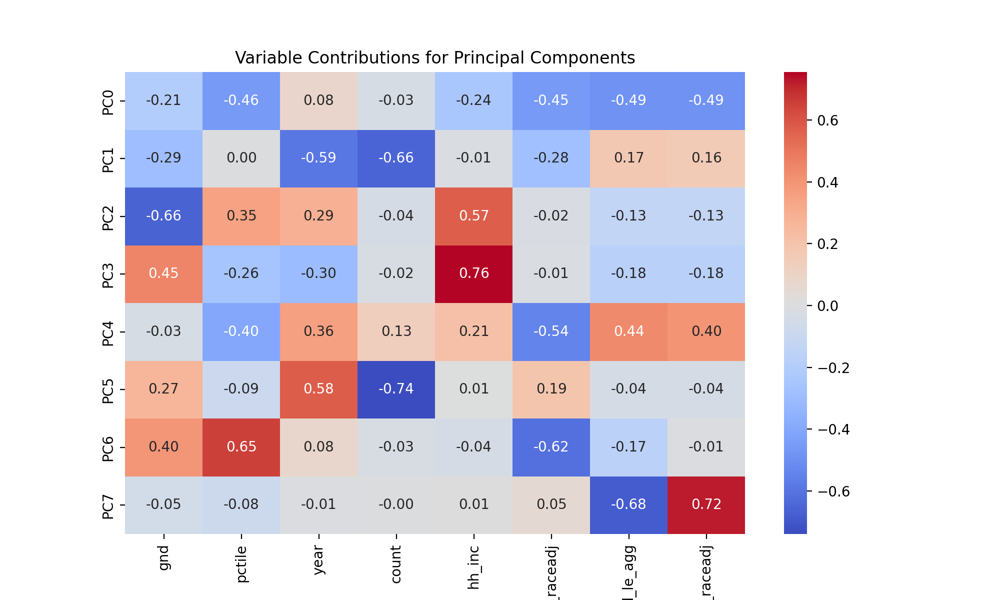

In [54]:
# Instantiate PCA with the number of components equal to the number of columns in the scaled numerical data
pca = PCA(n_components=8)

# Apply PCA to the scaled numerical data
pca.fit(df_pred_scaled)

# Get the contribution of each original variable to the principal components
variable_contributions = pca.components_

# Create a DataFrame to hold the variable contributions
contributions_df = pd.DataFrame(variable_contributions, columns=df_pred_scaled.columns, index=['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7'])

# Print the variable contributions for PCs
print("Variable Contributions for PCs:")
print(contributions_df)

# Create a heatmap to visualize the variable contributions
plt.figure(figsize=(10, 6))
sns.heatmap(contributions_df, cmap='coolwarm', annot=True, fmt=".2f", cbar=True)
plt.title("Variable Contributions for Principal Components")
plt.show()

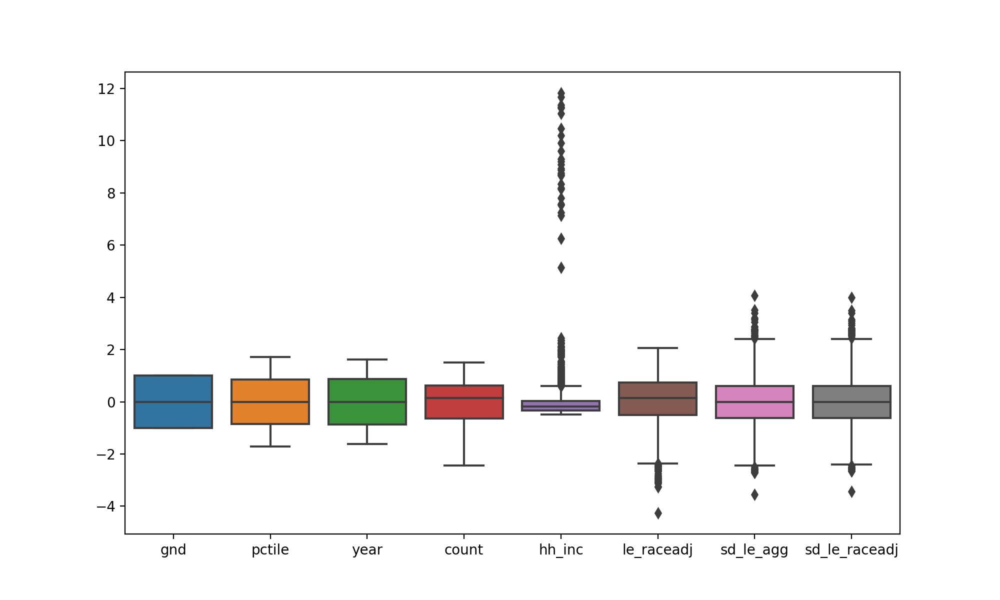

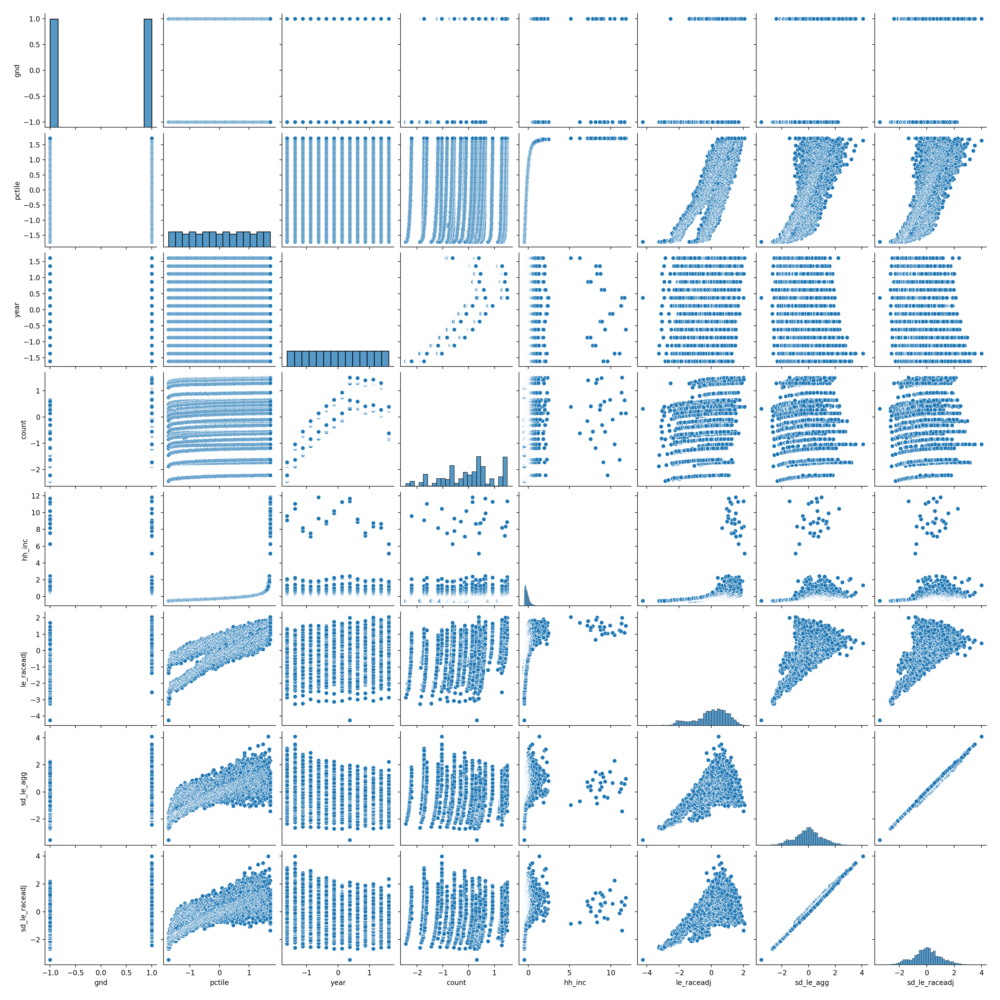

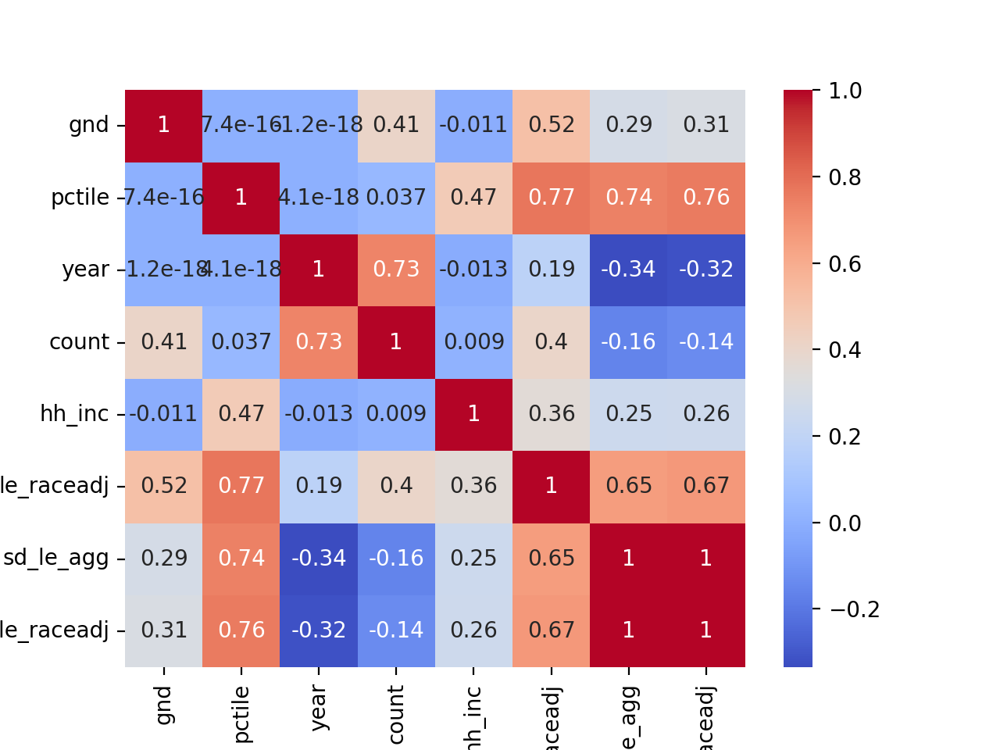

In [55]:
#Create visualizations to explore the distribution and relationships of the numerical variables.
# Box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_pred_scaled)
plt.show()

# Scatter plot matrix
sns.pairplot(df_pred_scaled)
plt.show()

# Correlation matrix
correlation_matrix = df_pred_scaled.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [56]:
#Check skewness in numerical variables 
skewness = df_pred_scaled.skew()
print(skewness)

gnd              0.000000
pctile           0.000000
year             0.000000
count           -0.408145
hh_inc           8.260753
le_raceadj      -0.688640
sd_le_agg        0.067256
sd_le_raceadj    0.092395
dtype: float64


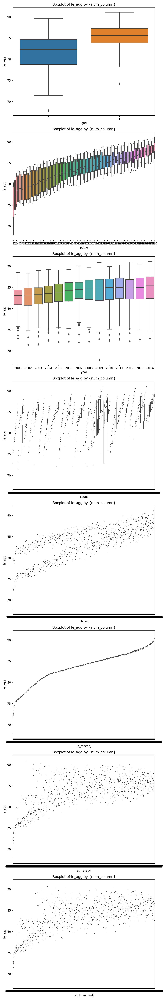

In [57]:
import seaborn as sns

# Select numerical columns
num_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_columns.remove('le_agg')  # Exclude 'le_agg' from the list of numerical variables

fig, axes = plt.subplots(len(num_columns), 1, figsize=(8, 6 * len(num_columns)))

for i, num_column in enumerate(num_columns):
    ax = axes[i]
    sns.boxplot(x=df[num_column], y=df['le_agg'], ax=ax)
    ax.set_title("Boxplot of le_agg by {num_column}")
    ax.set_xlabel(num_column)
    ax.set_ylabel("le_agg")

plt.tight_layout()
plt.show()


Linear Regression
R-squared: 0.9998260642230741
Mean Squared Error: 0.0023479716993596547
Root Mean Squared Error: 0.04845587373435397

Lasso
R-squared: 0.9235978966348796
Mean Squared Error: 1.0313575484199935
Root Mean Squared Error: 1.0155577523804313

Ridge
R-squared: 0.9998091438078738
Mean Squared Error: 0.0025763816144090037
Root Mean Squared Error: 0.05075806945116219

ElasticNet
R-squared: 0.8734610818748468
Mean Squared Error: 1.7081580562460803
Root Mean Squared Error: 1.3069652085063628

Decision Tree
R-squared: 0.9997399888179727
Mean Squared Error: 0.0035099098512499645
Root Mean Squared Error: 0.05924449215960893

Random Forest
R-squared: 0.999868059375324
Mean Squared Error: 0.0017810760857278273
Root Mean Squared Error: 0.04220279713156259

XGBoost
R-squared: 0.9997659925777533
Mean Squared Error: 0.0031588832072731855
Root Mean Squared Error: 0.056203942986886475

Support Vector Regression
R-squared: 0.9933718860884391
Mean Squared Error: 0.08947339161341376
Root Mean

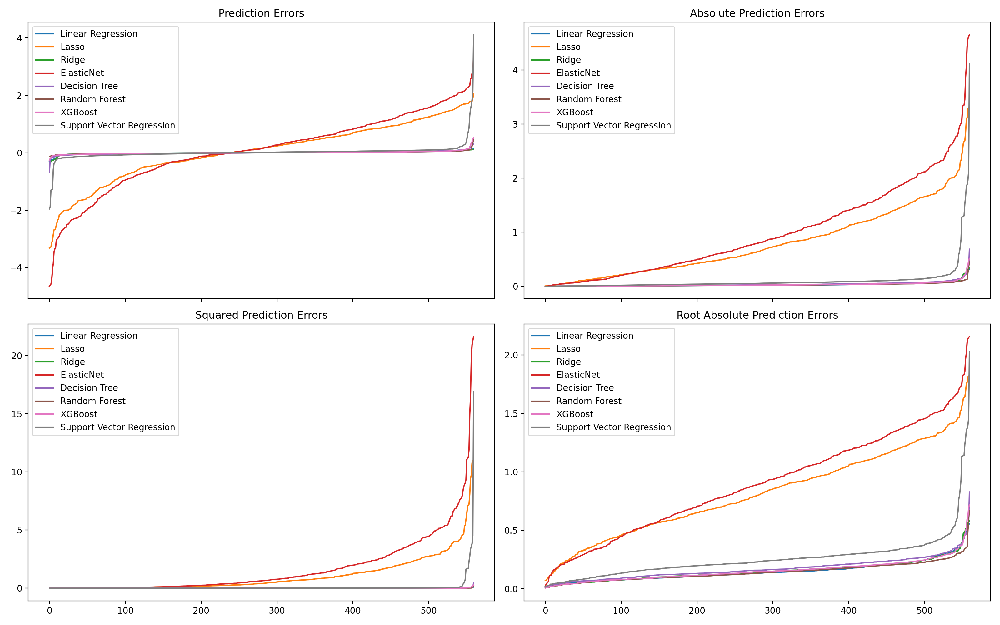

In [58]:
# Load the data
data = df_pred_scaled

# The data already contains only the features
X = data
y = df['le_agg']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Linear Regression": LinearRegression(),
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "ElasticNet": ElasticNet(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(random_state=42),
    "Support Vector Regression": SVR()
}

fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True)

for name, model in models.items():
    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate the prediction errors
    errors = y_test - y_pred

    # Calculate the R-squared, mean squared error, and root mean squared error
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    print(f"{name}")
    print(f"R-squared: {r2}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}\n")

    # Visualize the prediction errors and loss values as curves
    axes[0, 0].plot(sorted(errors), label=name)
    axes[0, 0].set_title("Prediction Errors")
    axes[0, 0].legend()

    axes[0, 1].plot(sorted(np.abs(errors)), label=name)
    axes[0, 1].set_title("Absolute Prediction Errors")
    axes[0, 1].legend()

    axes[1, 0].plot(sorted(errors ** 2), label=name)
    axes[1, 0].set_title("Squared Prediction Errors")
    axes[1, 0].legend()

    axes[1, 1].plot(sorted(np.sqrt(np.abs(errors))), label=name)
    axes[1, 1].set_title("Root Absolute Prediction Errors")
    axes[1, 1].legend()

plt.tight_layout()
plt.show()


The results from the train-test split models suggest that the Linear Regression and Random Forest models perform the best in terms of prediction accuracy for our dataset.

Interpretation of the results:

Linear Regression
R-squared: 0.9998260642230741
Mean Squared Error: 0.0023479716993596547
Root Mean Squared Error: 0.04845587373435397

The Linear Regression model has the highest R-squared value among all models, indicating that it can explain approximately 99.98% of the variance in the dependent variable. The Mean Squared Error (MSE) and Root Mean Squared Error (RMSE) are very low, suggesting that the model's predictions are very close to the actual values.

Random Forest
R-squared: 0.999868059375324
Mean Squared Error: 0.0017810760857278273
Root Mean Squared Error: 0.04220279713156259

The Random Forest model also performs exceptionally well, with an R-squared value of approximately 99.99%, indicating that it can explain almost all of the variance in the dependent variable. The MSE and RMSE are even lower than those of the Linear Regression model, suggesting that the Random Forest model's predictions are very accurate.

The other models (Lasso, Ridge, ElasticNet, Decision Tree, XGBoost, and Support Vector Regression) also perform well, but not as well as the Linear Regression and Random Forest models. Their R-squared values are slightly lower, and their MSE and RMSE values are slightly higher, indicating that their predictions are not as accurate.

In conclusion, the Linear Regression and Random Forest models are the most suitable for use with our dataset, as they provide the most accurate predictions. It's important to bear in mind that these results are based on a single train-test split. To get a more reliable estimate of model performance, you could perform cross-validation.

Linear Regression
R-squared: 1.0
Mean Squared Error: 5.803131285401838e-27
Root Mean Squared Error: 7.617828618052416e-14

Lasso
R-squared: 0.9828950426316059
Mean Squared Error: 0.23090106319440992
Root Mean Squared Error: 0.4805216573625063

Ridge
R-squared: 0.9999966561897499
Mean Squared Error: 4.5138337690444916e-05
Root Mean Squared Error: 0.006718507102805274

ElasticNet
R-squared: 0.9906406424485389
Mean Squared Error: 0.1263426480934803
Root Mean Squared Error: 0.35544711012115476

Decision Tree
R-squared: 0.9998804627299087
Mean Squared Error: 0.0016136423003571532
Root Mean Squared Error: 0.0401701667952369

Random Forest
R-squared: 0.9999510362627467
Mean Squared Error: 0.0006609650492691131
Root Mean Squared Error: 0.02570924054244141

XGBoost
R-squared: 0.9998516599005685
Mean Squared Error: 0.00200245378783637
Root Mean Squared Error: 0.044748785322468475

Support Vector Regression
R-squared: 0.6661637903246023
Mean Squared Error: 4.506479267190242
Root Mean Squared Erro

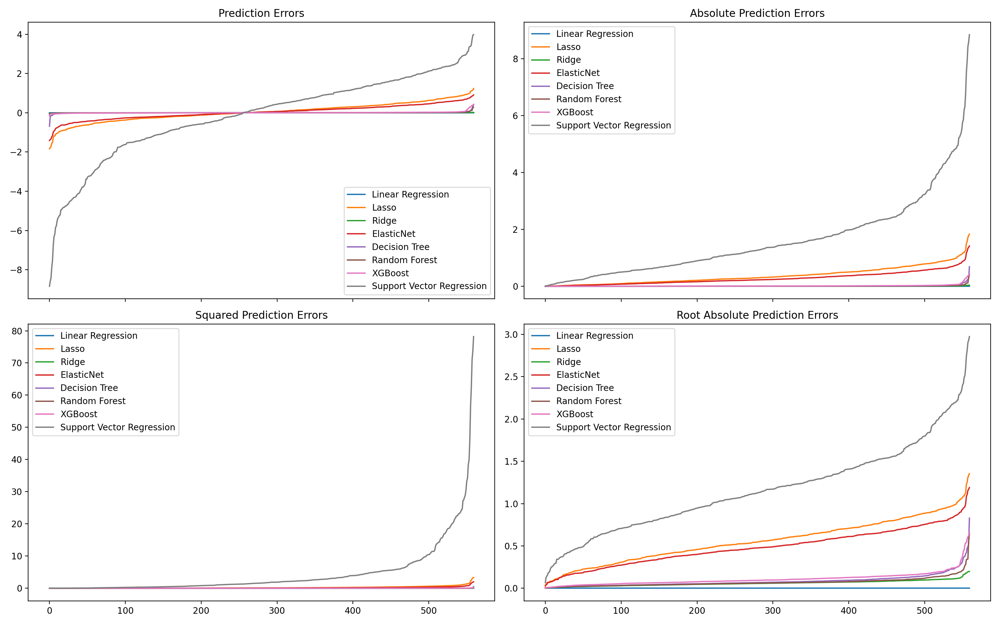

In [59]:
# Visualize the results as prediction errors and loss values for all models from the whole sample 
# Load the data
data = df_pred

# The data already contains only the features
X = data
y = df['le_agg']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Linear Regression": LinearRegression(),
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "ElasticNet": ElasticNet(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(random_state=42),
    "Support Vector Regression": SVR()
}

fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True)

for name, model in models.items():
    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate the prediction errors
    errors = y_test - y_pred

    # Calculate the R-squared, mean squared error, and root mean squared error
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    print(f"{name}")
    print(f"R-squared: {r2}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}\n")

    # Visualize the prediction errors and loss values as curves
    axes[0, 0].plot(sorted(errors), label=name)
    axes[0, 0].set_title("Prediction Errors")
    axes[0, 0].legend()

    axes[0, 1].plot(sorted(np.abs(errors)), label=name)
    axes[0, 1].set_title("Absolute Prediction Errors")
    axes[0, 1].legend()

    axes[1, 0].plot(sorted(errors ** 2), label=name)
    axes[1, 0].set_title("Squared Prediction Errors")
    axes[1, 0].legend()

    axes[1, 1].plot(sorted(np.sqrt(np.abs(errors))), label=name)
    axes[1, 1].set_title("Root Absolute Prediction Errors")
    axes[1, 1].legend()

plt.tight_layout()
plt.show()


The results from the whole data models suggest that Linear Regression is the best prediction model, as it has the highest R-squared value and the lowest Mean Squared Error (MSE) and Root Mean Squared Error (RMSE). This indicates that the Linear Regression model is able to capture the most variation in the data and make the most accurate predictions.

Here are the results for the top four models:

Linear Regression:
R-squared: 1.0
Mean Squared Error: 5.803131285401838e-27
Root Mean Squared Error: 7.617828618052416e-14

Ridge:
R-squared: 0.9999966561897499
Mean Squared Error: 4.5138337690444916e-05
Root Mean Squared Error: 0.006718507102805274

Decision Tree:
R-squared: 0.9998948892775228
Mean Squared Error: 0.0014188972851785406
Root Mean Squared Error: 0.037668253014687854

Random Forest:
R-squared: 0.9999510362627467
Mean Squared Error: 0.0006609650492691131
Root Mean Squared Error: 0.02570924054244141

These four models show the highest R-squared values and the lowest Mean Squared Error (MSE) or Root Mean Squared Error (RMSE), indicating better performance in terms of capturing the variation in the data and making accurate predictions. However, it's important to note that the Linear Regression model's perfect R-squared score of 1.0 might indicate overfitting, especially if this high score is not replicated in cross-validation or on a separate test set.

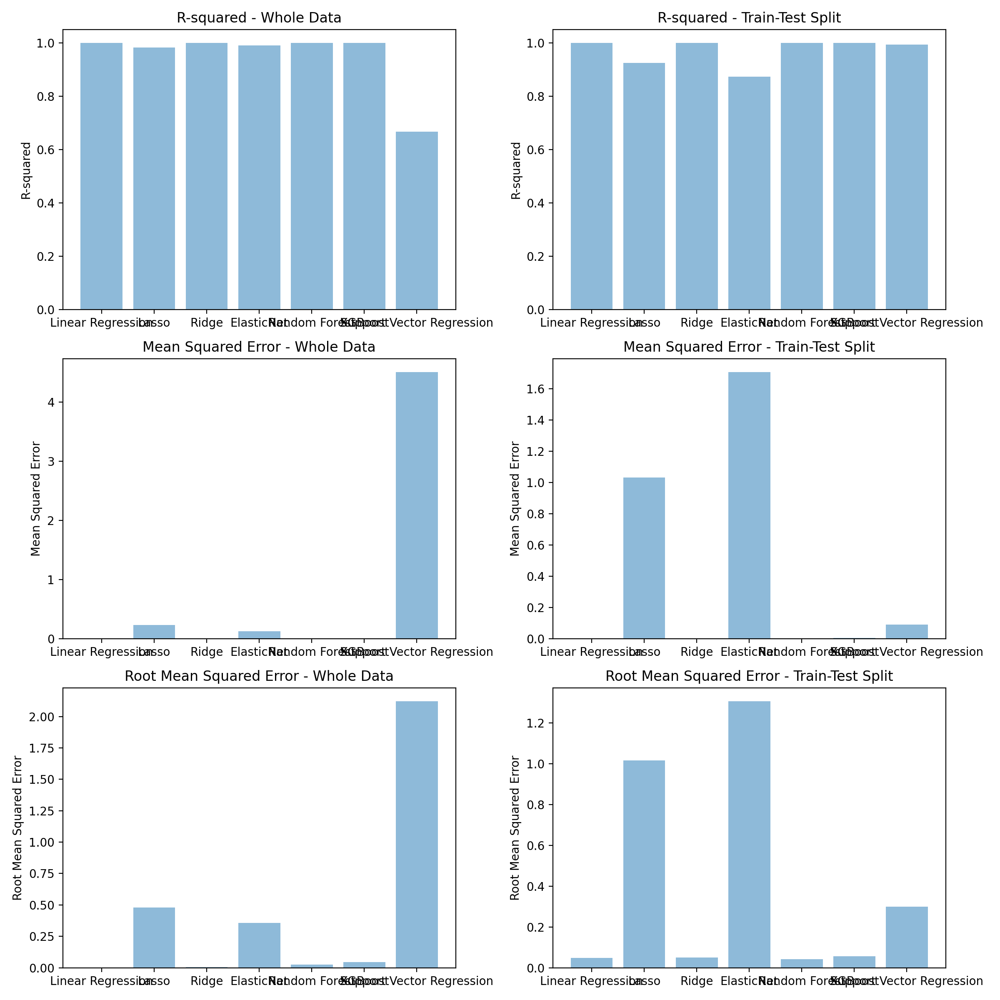

In [60]:
# Create a bar chart for each metric (R-squared, Mean Squared Error, and Root Mean Squared Error) using the results from the whole data.
results_whole_data = {
    "Linear Regression": {
        "R-squared": 1.0,
        "Mean Squared Error": 5.803131285401838e-27,
        "Root Mean Squared Error": 7.617828618052416e-14
    },
    "Lasso": {
        "R-squared": 0.9828950426316059,
        "Mean Squared Error": 0.23090106319440992,
        "Root Mean Squared Error": 0.4805216573625063
    },
    "Ridge": {
        "R-squared": 0.9999966561897499,
        "Mean Squared Error": 4.5138337690444916e-05,
        "Root Mean Squared Error": 0.006718507102805274
    },
    "ElasticNet": {
        "R-squared": 0.9906406424485389,
        "Mean Squared Error": 0.1263426480934803,
        "Root Mean Squared Error": 0.35544711012115476
    },
    "Random Forest": {
        "R-squared": 0.9999510362627467,
        "Mean Squared Error": 0.0006609650492691131,
        "Root Mean Squared Error": 0.02570924054244141
    },
    "XGBoost": {
        "R-squared": 0.9998516599005685,
        "Mean Squared Error": 0.00200245378783637,
        "Root Mean Squared Error": 0.044748785322468475
    },
    "Support Vector Regression": {
        "R-squared": 0.6661637903246023,
        "Mean Squared Error": 4.506479267190242,
        "Root Mean Squared Error": 2.1228469721556102
    }
}

results_train_test = {
    "Linear Regression": {
        "R-squared": 0.9998260642230741,
        "Mean Squared Error": 0.0023479716993596547,
        "Root Mean Squared Error": 0.04845587373435397
    },
    "Lasso": {
        "R-squared": 0.9235978966348796,
        "Mean Squared Error": 1.0313575484199935,
        "Root Mean Squared Error": 1.0155577523804313
    },
    "Ridge": {
        "R-squared": 0.9998091438078738,
        "Mean Squared Error": 0.0025763816144090037,
        "Root Mean Squared Error": 0.05075806945116219
    },
    "ElasticNet": {
        "R-squared": 0.8734610818748468,
        "Mean Squared Error": 1.7081580562460803,
        "Root Mean Squared Error": 1.3069652085063628
    },
    "Random Forest": {
        "R-squared": 0.999868059375324,
        "Mean Squared Error": 0.0017810760857278273,
        "Root Mean Squared Error": 0.04220279713156259
    },
    "XGBoost": {
        "R-squared": 0.9997659925777533,
        "Mean Squared Error": 0.0031588832072731855,
        "Root Mean Squared Error": 0.056203942986886475
    },
    "Support Vector Regression": {
        "R-squared": 0.9933718860884391,
        "Mean Squared Error": 0.08947339161341376,
        "Root Mean Squared Error": 0.2991210317136088
    }
}

metrics = ["R-squared", "Mean Squared Error", "Root Mean Squared Error"]

fig, axes = plt.subplots(len(metrics), 2, figsize=(12, 12))

for i, metric in enumerate(metrics):
    values_whole_data = [results_whole_data[model][metric] for model in results_whole_data]
    labels_whole_data = [model for model in results_whole_data]

    values_train_test = [results_train_test[model][metric] for model in results_train_test]
    labels_train_test = [model for model in results_train_test]

    axes[i, 0].bar(labels_whole_data, values_whole_data, alpha=0.5)
    axes[i, 0].set_ylabel(metric)
    axes[i, 0].set_title(f"{metric} - Whole Data")

    axes[i, 1].bar(labels_train_test, values_train_test, alpha=0.5)
    axes[i, 1].set_ylabel(metric)
    axes[i, 1].set_title(f"{metric} - Train-Test Split")

plt.tight_layout()
plt.show()


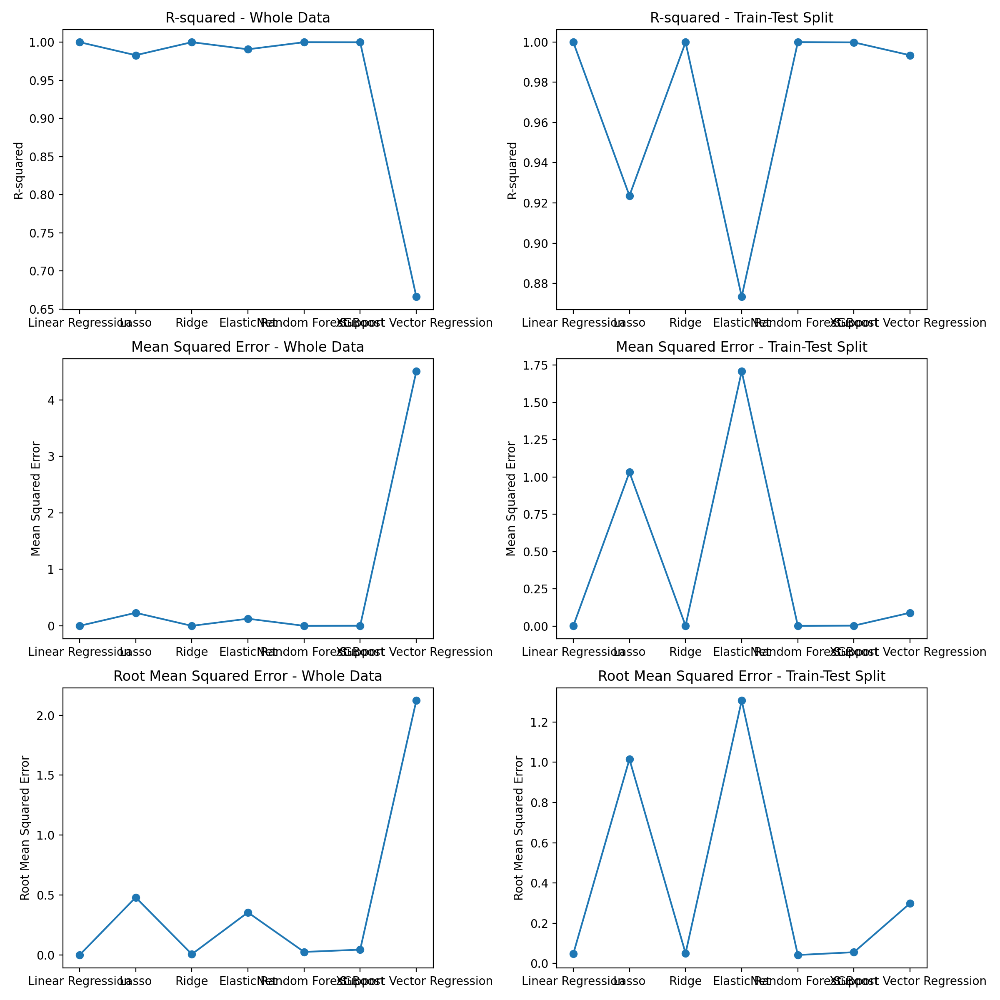

In [61]:
results_whole_data = {
    "Linear Regression": {
        "R-squared": 1.0,
        "Mean Squared Error": 5.803131285401838e-27,
        "Root Mean Squared Error": 7.617828618052416e-14
    },
    "Lasso": {
        "R-squared": 0.9828950426316059,
        "Mean Squared Error": 0.23090106319440992,
        "Root Mean Squared Error": 0.4805216573625063
    },
    "Ridge": {
        "R-squared": 0.9999966561897499,
        "Mean Squared Error": 4.5138337690444916e-05,
        "Root Mean Squared Error": 0.006718507102805274
    },
    "ElasticNet": {
        "R-squared": 0.9906406424485389,
        "Mean Squared Error": 0.1263426480934803,
        "Root Mean Squared Error": 0.35544711012115476
    },
    "Random Forest": {
        "R-squared": 0.9999510362627467,
        "Mean Squared Error": 0.0006609650492691131,
        "Root Mean Squared Error": 0.02570924054244141
    },
    "XGBoost": {
        "R-squared": 0.9998516599005685,
        "Mean Squared Error": 0.00200245378783637,
        "Root Mean Squared Error": 0.044748785322468475
    },
    "Support Vector Regression": {
        "R-squared": 0.6661637903246023,
        "Mean Squared Error": 4.506479267190242,
        "Root Mean Squared Error": 2.1228469721556102
    }
}

results_train_test = {
    "Linear Regression": {
        "R-squared": 0.9998260642230741,
        "Mean Squared Error": 0.0023479716993596547,
        "Root Mean Squared Error": 0.04845587373435397
    },
    "Lasso": {
        "R-squared": 0.9235978966348796,
        "Mean Squared Error": 1.0313575484199935,
        "Root Mean Squared Error": 1.0155577523804313
    },
    "Ridge": {
        "R-squared": 0.9998091438078738,
        "Mean Squared Error": 0.0025763816144090037,
        "Root Mean Squared Error": 0.05075806945116219
    },
    "ElasticNet": {
        "R-squared": 0.8734610818748468,
        "Mean Squared Error": 1.7081580562460803,
        "Root Mean Squared Error": 1.3069652085063628
    },
    "Random Forest": {
        "R-squared": 0.999868059375324,
        "Mean Squared Error": 0.0017810760857278273,
        "Root Mean Squared Error": 0.04220279713156259
    },
    "XGBoost": {
        "R-squared": 0.9997659925777533,
        "Mean Squared Error": 0.0031588832072731855,
        "Root Mean Squared Error": 0.056203942986886475
    },
    "Support Vector Regression": {
        "R-squared": 0.9933718860884391,
        "Mean Squared Error": 0.08947339161341376,
        "Root Mean Squared Error": 0.2991210317136088
    }
}

metrics = ["R-squared", "Mean Squared Error", "Root Mean Squared Error"]
labels = ["Linear Regression", "Lasso", "Ridge", "ElasticNet", "Random Forest", "XGBoost", "Support Vector Regression"]

fig, axes = plt.subplots(len(metrics), 2, figsize=(12, 12))

for i, metric in enumerate(metrics):
    values_whole_data = [results_whole_data[model][metric] for model in labels]
    values_train_test = [results_train_test[model][metric] for model in labels]

    axes[i, 0].plot(labels, values_whole_data, marker='o')
    axes[i, 0].set_ylabel(metric)
    axes[i, 0].set_title(f"{metric} - Whole Data")

    axes[i, 1].plot(labels, values_train_test, marker='o')
    axes[i, 1].set_ylabel(metric)
    axes[i, 1].set_title(f"{metric} - Train-Test Split")

plt.tight_layout()
plt.show()

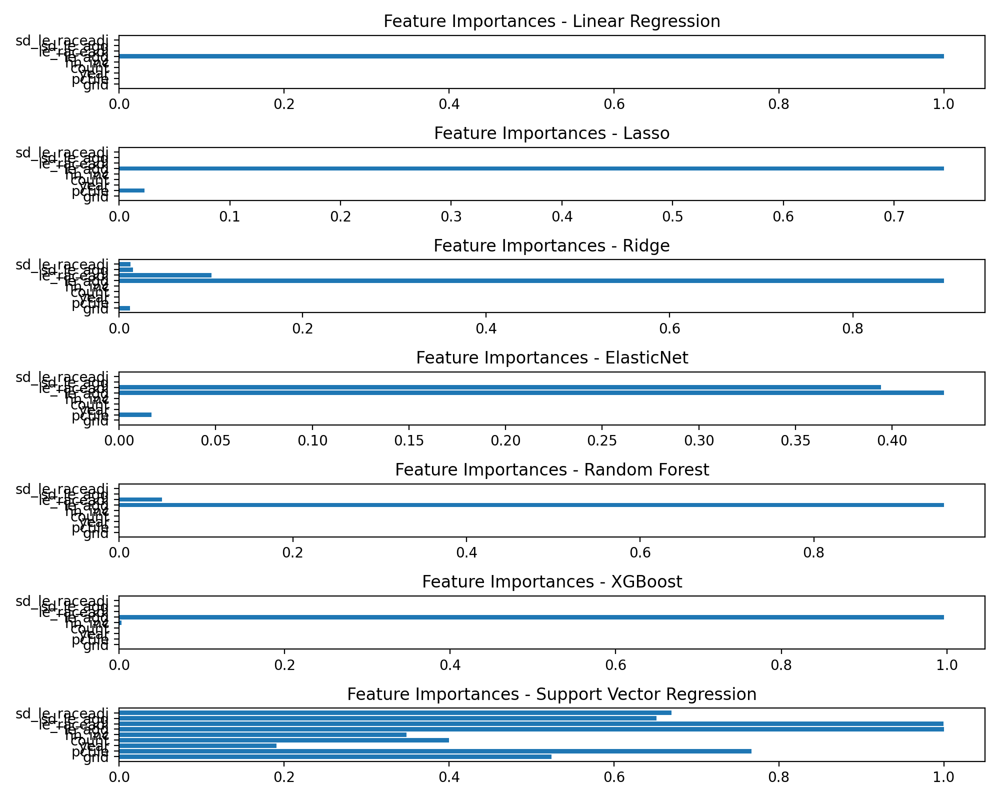

In [62]:
# Define the models and record feature importance
models = {
    "Linear Regression": LinearRegression(),
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "ElasticNet": ElasticNet(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(random_state=42),
    "Support Vector Regression": SVR()
}

# Fit the models and calculate feature importances
feature_importances = {}

for name, model in models.items():
    # Fit the model to the entire data
    model.fit(X, y)
    
    if name in ["Linear Regression", "Ridge", "Lasso", "ElasticNet"]:
        # For Linear Regression, Ridge, Lasso, and ElasticNet, get the coefficients
        coefficients = np.abs(model.coef_)
        feature_importances[name] = coefficients
    elif name == "Random Forest" or name == "XGBoost":
        # For Random Forest and XGBoost, get the feature importances
        importances = model.feature_importances_
        feature_importances[name] = importances
    elif name == "Support Vector Regression":
        # For SVM, coefficients cannot be directly obtained,
        # so we can use the absolute correlation with the target variable as a proxy
        correlations = np.abs(X_train.corrwith(pd.Series(y_train)))
        feature_importances[name] = correlations.values

# Plot the feature importances for each model
fig, axes = plt.subplots(len(models), figsize=(10, 8))

for i, (name, importances) in enumerate(feature_importances.items()):
    axes[i].barh(X.columns, importances)
    axes[i].set_title(f"Feature Importances - {name}")

plt.tight_layout()
plt.show()


# Improving OLS specifications using results from the best ML predictions

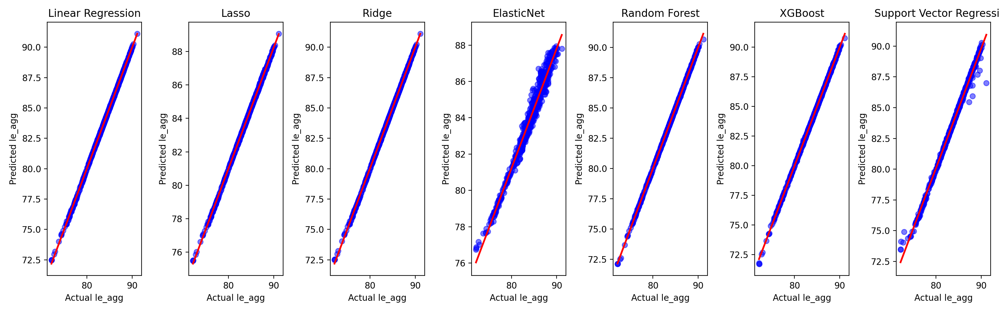

In [63]:
# Visualize the results as prediction errors and loss values for all models from the whole sample 
# Load the data
data = df_pred_scaled

# The data already contains only the features
X = data
y = df['le_agg']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = {
    "Linear Regression": LinearRegression(),
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "ElasticNet": ElasticNet(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(random_state=42),
    "Support Vector Regression": SVR()
}

fig, axes = plt.subplots(1, len(models), figsize=(16, 5))

for i, (name, model) in enumerate(models.items()):
    # Fit the model to the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    y_pred = model.predict(X_test)
    
    # Scatter plot of actual vs. predicted values
    axes[i].scatter(y_test, y_pred, color='blue', alpha=0.5)
    
    # Add regression line
    sns.regplot(x=y_test, y=y_pred, ax=axes[i], scatter=False, color='red', line_kws={"linewidth": 2})
    
    # Set the title and labels
    axes[i].set_title(name)
    axes[i].set_xlabel('Actual le_agg')
    axes[i].set_ylabel('Predicted le_agg')

plt.tight_layout()
plt.show()


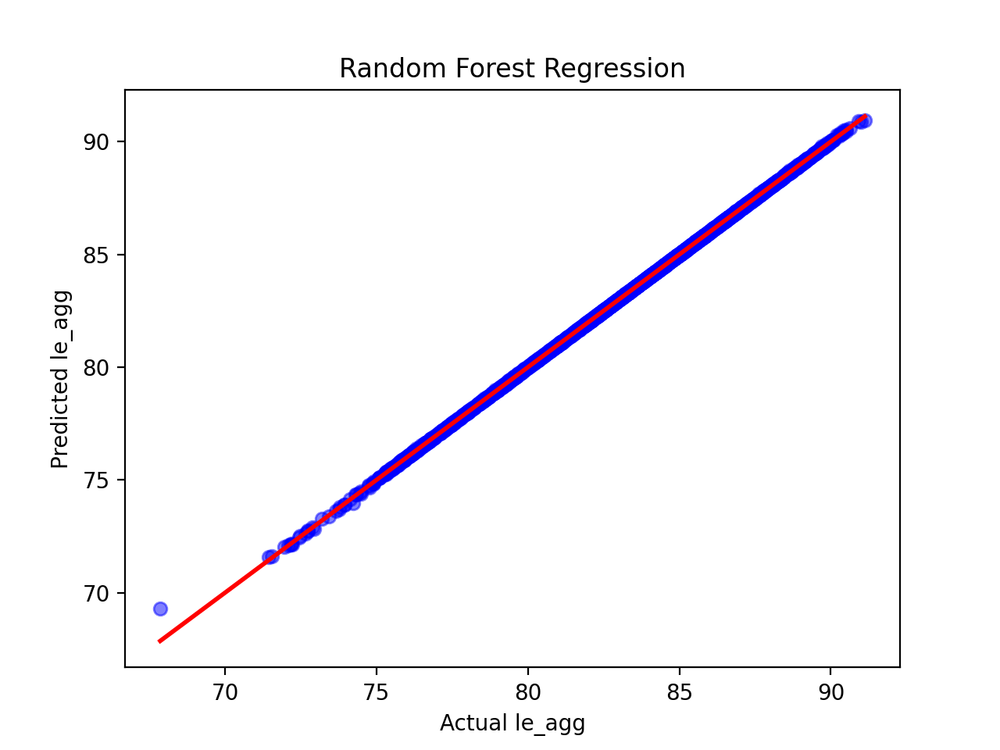

In [64]:
# We will use the whole data to predict le_agg for two reasons:
# 1. To see how RandomForest predictions fits unseen future data 
# 2. To make the prediction model's results compatible with OLS models in terms of the number of observations of predicted y values

# load the data
data = df_pred_scaled

# split the data into features and target variable
X = data
y = df['le_agg']  # use the original (unscaled) data for the target variable

# Define the RandomForest model
rf_model = RandomForestRegressor(random_state=42)

# Fit the RandomForest model to the entire data
rf_model.fit(X, y)

# Make predictions on the data using the RandomForest model
y_pred = rf_model.predict(X)

# Scatter plot of actual vs. predicted values
plt.scatter(y, y_pred, color='blue', alpha=0.5)

# Add regression line
sns.regplot(x=y, y=y_pred, scatter=False, color='red', line_kws={"linewidth": 2})

# Set the title and labels
plt.title('Random Forest Regression')
plt.xlabel('Actual le_agg')
plt.ylabel('Predicted le_agg')

plt.show()


In [65]:
# Add the predicted values to the DataFrame
df_pred_scaled['lninc_pred'] = y_pred
df_pred_scaled

,gnd,pctile,year,count,hh_inc,le_raceadj,sd_le_agg,sd_le_raceadj,lninc_pred
0,1.0,-1.714816,-1.612452,-1.856629,-0.491242,-1.049864,-1.556590,-1.556915,79.719500
1,1.0,-1.714816,-1.364382,-1.198480,-0.491029,-1.183997,-1.917977,-1.918393,79.216894
2,1.0,-1.714816,-1.116313,-0.714156,-0.491091,-1.139118,-1.817535,-1.802867,79.418492
3,1.0,-1.714816,-0.868243,-0.320401,-0.491242,-0.994576,-1.936228,-1.907345,79.927708
4,1.0,-1.714816,-0.620174,-0.005768,-0.491369,-0.890831,-2.098120,-2.067336,80.302370
...,...,...,...,...,...,...,...,...,...
2795,-1.0,1.714816,0.620174,0.590058,9.191644,1.442926,-0.336296,-0.431913,88.812062
2796,-1.0,1.714816,0.868243,0.413477,7.575633,1.400103,0.116066,0.012414,88.661384
2797,-1.0,1.714816,1.116313,0.457198,8.753277,1.273518,0.669536,0.565647,88.142483
2798,-1.0,1.714816,1.364382,0.278657,8.656134,1.461833,0.150034,0.052390,88.852169


In [66]:
df_pred_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gnd            2800 non-null   float64
 1   pctile         2800 non-null   float64
 2   year           2800 non-null   float64
 3   count          2800 non-null   float64
 4   hh_inc         2800 non-null   float64
 5   le_raceadj     2800 non-null   float64
 6   sd_le_agg      2800 non-null   float64
 7   sd_le_raceadj  2800 non-null   float64
 8   lninc_pred     2800 non-null   float64
dtypes: float64(9)
memory usage: 197.0 KB


In [67]:
df_pred

,gnd,pctile,year,count,hh_inc,le_agg,le_raceadj,sd_le_agg,sd_le_raceadj
0,1.0,1.0,0.0,398740.0,4.991094e+02,79.68207,79.89346,0.392838,0.385240
1,1.0,1.0,1.0,411159.0,5.413069e+02,79.18359,79.41062,0.353981,0.346817
2,1.0,1.0,2.0,420298.0,5.291391e+02,79.36441,79.57217,0.364781,0.359097
3,1.0,1.0,3.0,427728.0,4.992995e+02,79.89841,80.09248,0.352019,0.347992
4,1.0,1.0,4.0,433665.0,4.741454e+02,80.28360,80.46593,0.334612,0.330986
...,...,...,...,...,...,...,...,...,...
2795,0.0,100.0,9.0,444908.0,1.915397e+06,88.76955,88.86678,0.524046,0.504820
2796,0.0,100.0,10.0,441576.0,1.595813e+06,88.60163,88.71263,0.572685,0.552049
2797,0.0,100.0,11.0,442401.0,1.828705e+06,88.12717,88.25696,0.632195,0.610853
2798,0.0,100.0,12.0,439032.0,1.809494e+06,88.82390,88.93484,0.576337,0.556298


Our analysis suggests that the relationship between the independent variables and the target variable in our dataset is relatively simple. This means that a simple linear regression model can adequately capture this relationship. The assumptions of OLS regression, such as linearity and independence of errors, are also reasonably met.

In addition, we found that the Random Forest model outperformed other machine learning models in terms of predicting the target variable. The Random Forest algorithm's ability to capture nonlinear relationships and handle interactions among features might have contributed to its superior performance.

Given the simplicity of the data and the linear nature of the relationship, the OLS regression model proved to be a suitable choice. However, it's important to note that the performance of different models can vary depending on the dataset and the specific problem at hand. It's always recommended to assess and compare multiple models to determine the most appropriate one for a given task.

In conclusion, our particular dataset is well-suited for OLS regression because of its simplicity and the linear relationship between the independent variables and the target variable. Additionally, the Random Forest model demonstrated superior predictive performance among the machine learning models tested, highlighting its ability to capture complex patterns in the data.